<h1><center><font color='green'>Implémentez un modèle de scoring</font></center></h1>


 # Import libraries 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# importer les librairies 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px

import plotly.figure_factory as ff
import plotly.graph_objects as go


import numpy as np
import pandas as pd
import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix


# Import Data

In [3]:
# for data visualization
# %matplotlib inline
# import matplotlib.pyplot as plt
# plt.style.use('bmh')
# import seaborn as sns
# import missingno as msno

# for pre-processing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
# from imblearn.pipeline import Pipeline
# from imblearn.over_sampling import SMOTE
# from imblearn.under_sampling import RandomUnderSampler

# for machine learning modelling
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix
import pickle


# for ignoring warnings
import warnings
warnings.filterwarnings("ignore")

from collections import Counter

from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [4]:
import collections


In [5]:
# PATH_BD
df_application_test_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/application_test.csv"
df_application_train_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/application_train.csv"
df_bureau_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/bureau.csv"
df_bureau_balance_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/bureau_balance.csv"
df_credit_card_balances_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/credit_card_balance.csv"

df_installments_payments_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/installments_payments.csv"
df_POS_CASH_balance_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/POS_CASH_balance.csv"
df_previous_application_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/previous_application.csv"
df_sample_submission_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/sample_submission.csv"

In [6]:
df_HomeCredit_path = "/content/drive/Othercomputers/MonPC/openclassrooms/projet7/HomeCredit_columns_description.csv"

In [7]:
# importer la base de donnée 
df_application_test = pd.read_csv (df_application_test_path)
df_application_train = pd.read_csv (df_application_train_path)
df_bureau = pd.read_csv (df_bureau_path)
df_bureau_balance = pd.read_csv (df_bureau_balance_path)
df_credit_card_balances = pd.read_csv (df_credit_card_balances_path)

df_installments_payments = pd.read_csv (df_installments_payments_path)
df_POS_CASH_balance = pd.read_csv (df_POS_CASH_balance_path)
df_previous_application = pd.read_csv (df_previous_application_path)
df_sample_submission = pd.read_csv (df_sample_submission_path)


In [8]:
df_HomeCredit = pd.read_csv(df_HomeCredit_path, encoding='latin')

# Data understanding 

                                 --------------------------------------------
                                 

- application_{train|test}.csv

*This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).



*Static data for all applications. One row represents one loan in our data sample.

In [ ]:
df_application_test.shape

(23112, 121)

In [ ]:
df_application_test.columns

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)

In [ ]:
df_application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_application_train.shape

(23282, 122)

In [ ]:
df_application_train.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [ ]:
df_application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


- bureau.csv

*All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).



*For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

In [ ]:
df_bureau.shape

(127318, 17)

In [ ]:
df_bureau.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

In [ ]:
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497.0,0.0,-153.0,-153.0,NaN,0.0,91323.0,0.0,NaN,0.0,Consumer credit,-131.0,NaN
1,215354,5714463,Active,currency 1,-208.0,0.0,1075.0,NaN,NaN,0.0,225000.0,171342.0,NaN,0.0,Credit card,-20.0,NaN
2,215354,5714464,Active,currency 1,-203.0,0.0,528.0,NaN,NaN,0.0,464323.5,NaN,NaN,0.0,Consumer credit,-16.0,NaN
3,215354,5714465,Active,currency 1,-203.0,0.0,NaN,NaN,NaN,0.0,90000.0,NaN,NaN,0.0,Credit card,-16.0,NaN
4,215354,5714466,Active,currency 1,-629.0,0.0,1197.0,NaN,77674.5,0.0,2700000.0,NaN,NaN,0.0,Consumer credit,-21.0,NaN


- bureau_balance.csv

*Monthly balances of previous credits in Credit Bureau.



*This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.


In [ ]:
df_bureau_balance.shape

(838958, 3)

In [ ]:
df_bureau_balance.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [ ]:
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0.0,C
1,5715448,-1.0,C
2,5715448,-2.0,C
3,5715448,-3.0,C
4,5715448,-4.0,C


- credit_card_balance.csv

*Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.


*This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.


In [ ]:
df_credit_card_balances.shape

(106554, 23)

In [ ]:
df_credit_card_balances.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [ ]:
df_credit_card_balances.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0.0,0.0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0.0,0.0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0.0,0.0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0.0,0.0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0.0,0.0


- installments_payments.csv

*Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
There is a) one row for every payment that was made plus b) one row each for missed payment.



*One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

In [ ]:
df_installments_payments.shape

(217030, 8)

In [ ]:
df_installments_payments.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

In [ ]:
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


- POS_CASH_balance.csv

*Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.



*This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

In [ ]:
df_POS_CASH_balance.shape

(293634, 8)

In [ ]:
df_POS_CASH_balance.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [ ]:
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0.0,0.0
1,1715348,367990,-33,36.0,35.0,Active,0.0,0.0
2,1784872,397406,-32,12.0,9.0,Active,0.0,0.0
3,1903291,269225,-35,48.0,42.0,Active,0.0,0.0
4,2341044,334279,-35,36.0,35.0,Active,0.0,0.0


- previous_application.csv

*All previous applications for Home Credit loans of clients who have loans in our sample.



*There is one row for each previous application related to loans in our data sample.

In [ ]:
df_previous_application.shape

(46986, 37)

In [ ]:
df_previous_application.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [ ]:
df_previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


- This file contains descriptions for the columns in the various data files.


In [ ]:
df_HomeCredit.shape

(219, 5)

In [ ]:
df_HomeCredit.columns

Index(['Unnamed: 0', 'Table', 'Row', 'Description', 'Special'], dtype='object')

In [ ]:
df_HomeCredit.head()

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


                                           ---------------------------------------------------

### Check Missing Values (NaNs) and duplicated

In [ ]:
# Only columns with NaNs count and percentage
columns = df_application_train.isnull().sum()[df_application_train.isnull().sum() != 0].keys()
nans_count = df_application_train.isnull().sum()[df_application_train.isnull().sum() != 0].values
nans_percentage = df_application_train.isnull().sum()[df_application_train.isnull().sum() != 0].values/df_application_train.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
pd.set_option('display.max_rows', 122)
nans_df


,Column,No. of NaNs,% of NaNs in Column
41,COMMONAREA_MEDI,214865,69.872297
13,COMMONAREA_AVG,214865,69.872297
27,COMMONAREA_MODE,214865,69.872297
49,NONLIVINGAPARTMENTS_MEDI,213514,69.432963
35,NONLIVINGAPARTMENTS_MODE,213514,69.432963
21,NONLIVINGAPARTMENTS_AVG,213514,69.432963
51,FONDKAPREMONT_MODE,210295,68.386172
33,LIVINGAPARTMENTS_MODE,210199,68.354953
47,LIVINGAPARTMENTS_MEDI,210199,68.354953
19,LIVINGAPARTMENTS_AVG,210199,68.354953


In [ ]:
# sum of all duplicated records in data
df_application_train.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_application_test.isnull().sum()[df_application_test.isnull().sum() != 0].keys()
nans_count = df_application_test.isnull().sum()[df_application_test.isnull().sum() != 0].values
nans_percentage = df_application_test.isnull().sum()[df_application_test.isnull().sum() != 0].values/df_application_test.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
25,COMMONAREA_MODE,33495,68.716150
39,COMMONAREA_MEDI,33495,68.716150
11,COMMONAREA_AVG,33495,68.716150
47,NONLIVINGAPARTMENTS_MEDI,33347,68.412523
19,NONLIVINGAPARTMENTS_AVG,33347,68.412523
33,NONLIVINGAPARTMENTS_MODE,33347,68.412523
49,FONDKAPREMONT_MODE,32797,67.284179
31,LIVINGAPARTMENTS_MODE,32780,67.249302
45,LIVINGAPARTMENTS_MEDI,32780,67.249302
17,LIVINGAPARTMENTS_AVG,32780,67.249302


In [ ]:
# sum of all duplicated records in data
df_application_test.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_bureau.isnull().sum()[df_bureau.isnull().sum() != 0].keys()
nans_count = df_bureau.isnull().sum()[df_bureau.isnull().sum() != 0].values
nans_percentage = df_bureau.isnull().sum()[df_bureau.isnull().sum() != 0].values/df_bureau.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
6,AMT_ANNUITY,1226791,71.473490
2,AMT_CREDIT_MAX_OVERDUE,1124488,65.513264
1,DAYS_ENDDATE_FACT,633653,36.916958
5,AMT_CREDIT_SUM_LIMIT,591780,34.477415
4,AMT_CREDIT_SUM_DEBT,257669,15.011932
0,DAYS_CREDIT_ENDDATE,105553,6.149573
3,AMT_CREDIT_SUM,13,0.000757


In [ ]:
# sum of all duplicated records in data
df_bureau.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_bureau_balance.isnull().sum()[df_bureau_balance.isnull().sum() != 0].keys()
nans_count = df_bureau_balance.isnull().sum()[df_bureau_balance.isnull().sum() != 0].values
nans_percentage = df_bureau_balance.isnull().sum()[df_bureau_balance.isnull().sum() != 0].values/df_bureau_balance.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column


In [ ]:
# sum of all duplicated records in data
df_bureau_balance.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_credit_card_balances.isnull().sum()[df_credit_card_balances.isnull().sum() != 0].keys()
nans_count = df_credit_card_balances.isnull().sum()[df_credit_card_balances.isnull().sum() != 0].values
nans_percentage = df_credit_card_balances.isnull().sum()[df_credit_card_balances.isnull().sum() != 0].values/df_credit_card_balances.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
4,AMT_PAYMENT_CURRENT,767988,19.998063
0,AMT_DRAWINGS_ATM_CURRENT,749816,19.524872
1,AMT_DRAWINGS_OTHER_CURRENT,749816,19.524872
2,AMT_DRAWINGS_POS_CURRENT,749816,19.524872
5,CNT_DRAWINGS_ATM_CURRENT,749816,19.524872
6,CNT_DRAWINGS_OTHER_CURRENT,749816,19.524872
7,CNT_DRAWINGS_POS_CURRENT,749816,19.524872
3,AMT_INST_MIN_REGULARITY,305236,7.948208
8,CNT_INSTALMENT_MATURE_CUM,305236,7.948208


In [ ]:
# sum of all duplicated records in data
df_credit_card_balances.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_installments_payments.isnull().sum()[df_installments_payments.isnull().sum() != 0].keys()
nans_count = df_installments_payments.isnull().sum()[df_installments_payments.isnull().sum() != 0].values
nans_percentage = df_installments_payments.isnull().sum()[df_installments_payments.isnull().sum() != 0].values/df_installments_payments.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
0,DAYS_ENTRY_PAYMENT,2905,0.021352
1,AMT_PAYMENT,2905,0.021352


In [ ]:
# sum of all duplicated records in data
df_installments_payments.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_POS_CASH_balance.isnull().sum()[df_POS_CASH_balance.isnull().sum() != 0].keys()
nans_count = df_POS_CASH_balance.isnull().sum()[df_POS_CASH_balance.isnull().sum() != 0].values
nans_percentage = df_POS_CASH_balance.isnull().sum()[df_POS_CASH_balance.isnull().sum() != 0].values/df_POS_CASH_balance.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
1,CNT_INSTALMENT_FUTURE,26087,0.260835
0,CNT_INSTALMENT,26071,0.260675


In [ ]:
# sum of all duplicated records in data
df_POS_CASH_balance.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_previous_application.isnull().sum()[df_previous_application.isnull().sum() != 0].keys()
nans_count = df_previous_application.isnull().sum()[df_previous_application.isnull().sum() != 0].values
nans_percentage = df_previous_application.isnull().sum()[df_previous_application.isnull().sum() != 0].values/df_previous_application.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column
5,RATE_INTEREST_PRIMARY,1664263,99.643698
6,RATE_INTEREST_PRIVILEGED,1664263,99.643698
2,AMT_DOWN_PAYMENT,895844,53.636480
4,RATE_DOWN_PAYMENT,895844,53.636480
7,NAME_TYPE_SUITE,820405,49.119754
10,DAYS_FIRST_DRAWING,673065,40.298129
11,DAYS_FIRST_DUE,673065,40.298129
12,DAYS_LAST_DUE_1ST_VERSION,673065,40.298129
13,DAYS_LAST_DUE,673065,40.298129
14,DAYS_TERMINATION,673065,40.298129


In [ ]:
# sum of all duplicated records in data
df_previous_application.duplicated().sum()

0

In [ ]:
# Only columns with NaNs count and percentage
columns = df_sample_submission.isnull().sum()[df_sample_submission.isnull().sum() != 0].keys()
nans_count = df_sample_submission.isnull().sum()[df_sample_submission.isnull().sum() != 0].values
nans_percentage = df_sample_submission.isnull().sum()[df_sample_submission.isnull().sum() != 0].values/df_sample_submission.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df

,Column,No. of NaNs,% of NaNs in Column


In [ ]:
# sum of all duplicated records in data
df_sample_submission.duplicated().sum()

0

                                         ------------------------------------

# Target Column

In [ ]:
# target value pour chaque classe 
print('Count of Each Class\n' + '-'*20)
print(df_application_train['TARGET'].value_counts())

Count of Each Class
--------------------
0    103393
1      9175
Name: TARGET, dtype: int64


In [ ]:
fig = px.histogram(df_application_train, x='TARGET',
                   barmode='group').update_xaxes(categoryorder = "total descending")
fig.update_layout(bargap=0.2)
fig.show()

- La plupart des clients peuvent rembourser leurs prêts, et quelques-uns ont des difficultés, de sorte que les données sont déséquilibrées :


*les données doivent être équilibrées.



*la précision n'est pas une mesure d'évaluation appropriée, elle sera trompeuse, mais les scores F1 ou ROC AUC sont appropriés dans ce cas.


#### Nombre des clients par sexe

In [ ]:
fig = px.histogram(df_application_train, x="CODE_GENDER",
                   barmode='group').update_xaxes(categoryorder = "total descending")
fig.update_layout(bargap=0.2)
fig.show()

- La plus part des clients sont des femmes


#### Nombre de clients dans chaque classe cible par sexe

In [ ]:
fig = px.histogram(df_application_train, x="TARGET",
             color='CODE_GENDER', barmode='group').update_xaxes(categoryorder = "total descending")
fig.show()

#### Nombre des clients dans chaque classe cible par type de contrat et sexe de chaque client

In [ ]:
fig = px.histogram(df_application_train, x="TARGET",
                   color="CODE_GENDER", barmode='group', 
                   facet_col='NAME_CONTRACT_TYPE').update_xaxes(categoryorder = "total descending")
fig.show()


#### Nombre de clients dans chaque classe cible par propriété immobilière et sexe de chaque client

In [ ]:
fig = px.histogram(df_application_train, x="TARGET",
                   color="CODE_GENDER", barmode='group', 
                   facet_col='FLAG_OWN_REALTY').update_xaxes(categoryorder = "total descending")
fig.show()

#### Nombre de clients dans chaque classe cible par propriété immobilière et type de contrat

In [ ]:
fig = px.histogram(df_application_train, x="NAME_CONTRACT_TYPE",
             color="FLAG_OWN_REALTY", barmode='group', 
                   facet_col='TARGET').update_xaxes(categoryorder = "total descending")
fig.show()

#### Nombre de clients dans chaque classe par LIVE_CITY_NOT_WORK_CITY

In [ ]:
df_HomeCredit[df_HomeCredit['Row'] == "LIVE_CITY_NOT_WORK_CITY"]['Description']

39    Flag if client's contact address does not matc...
Name: Description, dtype: object

In [ ]:
fig = px.histogram(df_application_train, x="LIVE_CITY_NOT_WORK_CITY",
             color="TARGET", barmode='group').update_xaxes(categoryorder = "total descending")

fig.show()

#### Pourcentage de clients par type d'éducation

In [ ]:
pie = go.Figure(data=[go.Pie(labels = df_application_train['NAME_EDUCATION_TYPE'].value_counts().keys(),
                             values = df_application_train['NAME_EDUCATION_TYPE'].value_counts().values)])
iplot(pie)

#### Nombre de membres de la famille des clients par classe

In [ ]:
fig = px.histogram(df_application_train, x="CNT_FAM_MEMBERS", color="TARGET", barmode='group')
fig.show()

#### Répartition du montant du crédit par classe

In [ ]:
fig = ff.create_distplot([df_application_train[df_application_train['TARGET']==0]['AMT_CREDIT'], 
                          df_application_train[df_application_train['TARGET']==1]['AMT_CREDIT']], 
                         ['target=> 0', 'target=> 1'],
                         bin_size = [2, 2],
                         show_rug=False,
                         show_hist=False,
                         show_curve=True 
                        )
fig.update_layout(xaxis = dict(title='AMT_CREDIT'),
                  yaxis =dict(title='Density'),
                  barmode='overlay')


fig.show()

#### Répartition du montant de la rente par classe

In [ ]:
fig = ff.create_distplot([df_application_train[df_application_train['TARGET']==0]['AMT_ANNUITY'].dropna(), 
                          df_application_train[df_application_train['TARGET']==1]['AMT_ANNUITY'].dropna()], 
                         ['target=> 0', 'target=> 1'],
                         bin_size = [2, 2],
                         show_rug=False,
                         show_hist=False,
                         show_curve=True 
                        )
fig.update_layout(xaxis = dict(title='AMT_ANNUITY'),
                  yaxis =dict(title='Density'),
                  barmode='overlay')


fig.show()


#### Pourcentage de clients par type de logement

In [ ]:
pie = go.Figure(data=[go.Pie(labels = df_application_train['NAME_HOUSING_TYPE'].value_counts().keys(),
                             values = df_application_train['NAME_HOUSING_TYPE'].value_counts().values)])
iplot(pie)

#### Pourcentage de clients par type de revenu

In [ ]:
pie = go.Figure(data=[go.Pie(labels = df_application_train['NAME_INCOME_TYPE'].value_counts().keys(),
                             values = df_application_train['NAME_INCOME_TYPE'].value_counts().values)])

iplot(pie)

#### Pourcentage de clients selon la situation familiale

In [ ]:
pie = go.Figure(data=[go.Pie(labels = df_application_train['NAME_FAMILY_STATUS'].value_counts().keys(),
                             values = df_application_train['NAME_FAMILY_STATUS'].value_counts().values)])

iplot(pie)

#### Nombre de clients dans chaque classe par type d'organisation

In [ ]:
fig = px.histogram(df_application_train, x="ORGANIZATION_TYPE", 
                   color="TARGET", barmode='group').update_xaxes(categoryorder = "total descending")
fig.show()

### Data preprocessing 

####  Preprocess application_train.csv and application_test.csv

In [ ]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

In [ ]:
# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv(df_application_train_path, nrows= num_rows)
    test_df = pd.read_csv(df_application_test_path, nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

#### Preprocess bureau.csv and bureau_balance.csv

In [ ]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv(df_bureau_path, nrows = num_rows)
    bb = pd.read_csv(df_bureau_balance_path, nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

#### Preprocess previous_applications.csv

In [ ]:
# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv(df_previous_application_path, nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

#### Preprocess POS_CASH_balance.csv

In [ ]:
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv(df_POS_CASH_balance_path, nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg

#### Preprocess installments_payments.csv

In [ ]:
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv(df_installments_payments_path, nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

#### Preprocess credit_card_balance.csv

In [ ]:
# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv(df_credit_card_balances_path, nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

In [ ]:
import numpy as np
import pandas as pd
import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

#### Merge Databases

In [ ]:
debug = False
num_rows = 10000 if debug else None
df = application_train_test(num_rows)
bureau = bureau_and_balance(num_rows)
df = df.join(bureau, how='left', on='SK_ID_CURR')

Train samples: 48744, test samples: 307511


In [ ]:
prev = previous_applications(num_rows)
df = df.join(prev, how='left', on='SK_ID_CURR')
    

In [ ]:
previous_applications(num_rows)

,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,...,REFUSED_HOUR_APPR_PROCESS_START_MAX,REFUSED_HOUR_APPR_PROCESS_START_MEAN,REFUSED_RATE_DOWN_PAYMENT_MIN,REFUSED_RATE_DOWN_PAYMENT_MAX,REFUSED_RATE_DOWN_PAYMENT_MEAN,REFUSED_DAYS_DECISION_MIN,REFUSED_DAYS_DECISION_MAX,REFUSED_DAYS_DECISION_MEAN,REFUSED_CNT_PAYMENT_MEAN,REFUSED_CNT_PAYMENT_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500,23787.0,23787.0,23787.00,1.044079,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000,179055.0,179055.0,179055.00,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500,68053.5,1035882.0,484191.00,0.868825,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000,20106.0,20106.0,20106.00,1.207699,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750,0.0,40153.5,20076.75,1.111173,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000,40455.0,40455.0,40455.00,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500,56821.5,56821.5,56821.50,1.013622,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750,13945.5,27306.0,20625.75,1.058833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pos = pos_cash(num_rows)
df = df.join(pos, how='left', on='SK_ID_CURR')


In [ ]:
df

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100001,0,0,0,0,135000.0,568800.0,20560.5,450000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100005,1,0,0,0,99000.0,222768.0,17370.0,180000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100013,1,1,0,0,202500.0,663264.0,69777.0,630000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,96.0
3,3,100028,0,0,0,2,315000.0,1575000.0,49018.5,1575000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49.0
4,4,100038,1,1,1,1,180000.0,625500.0,32067.0,625500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,307506,456251,1,0,1,0,157500.0,254700.0,27558.0,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356251,307507,456252,0,0,0,0,72000.0,269550.0,12001.5,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356252,307508,456253,0,0,0,0,153000.0,677664.0,29979.0,585000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356253,307509,456254,0,0,0,0,171000.0,370107.0,20205.0,319500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
ins = installments_payments(num_rows)
df = df.join(ins, how='left', on='SK_ID_CURR')


In [ ]:
cc = credit_card_balance(num_rows)
df = df.join(cc, how='left', on='SK_ID_CURR')

In [ ]:

path = r'/content/drive/Othercomputers/MonPC/openclassrooms/projet7/df.pickle'
df.to_pickle(path)

In [9]:

df = pd.read_pickle(r'/content/drive/Othercomputers/MonPC/openclassrooms/projet7/df.pickle')

In [10]:
df

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100001,0,0,0,0,135000.0,568800.0,20560.5,450000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100005,1,0,0,0,99000.0,222768.0,17370.0,180000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100013,1,1,0,0,202500.0,663264.0,69777.0,630000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,96.0
3,3,100028,0,0,0,2,315000.0,1575000.0,49018.5,1575000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49.0
4,4,100038,1,1,1,1,180000.0,625500.0,32067.0,625500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,307506,456251,1,0,1,0,157500.0,254700.0,27558.0,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356251,307507,456252,0,0,0,0,72000.0,269550.0,12001.5,225000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356252,307508,456253,0,0,0,0,153000.0,677664.0,29979.0,585000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356253,307509,456254,0,0,0,0,171000.0,370107.0,20205.0,319500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Modeling


#### First try with lightGBM model

In [ ]:
# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    print(best_features.sort_values(by="importance", ascending=False))
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')

In [ ]:


# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(df, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    import re
    submission_file_name = "submission_kernel02.csv"
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feature_importance_df)
    return feature_importance_df


Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 798)
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.798853	training's binary_logloss: 0.234207	valid_1's auc: 0.77785	valid_1's binary_logloss: 0.24391
[400]	training's auc: 0.822506	training's binary_logloss: 0.224137	valid_1's auc: 0.787573	valid_1's binary_logloss: 0.239846
[600]	training's auc: 0.837959	training's binary_logloss: 0.217795	valid_1's auc: 0.790499	valid_1's binary_logloss: 0.238687
[800]	training's auc: 0.851126	training's binary_logloss: 0.21233	valid_1's auc: 0.791985	valid_1's binary_logloss: 0.238165
[1000]	training's auc: 0.86234	training's binary_logloss: 0.207553	valid_1's auc: 0.792603	valid_1's binary_logloss: 0.237944
[1200]	training's auc: 0.872609	training's binary_logloss: 0.203074	valid_1's auc: 0.792745	valid_1's binary_logloss: 0.237842
[1400]	training's auc: 0.881785	training's binary_logloss: 0.

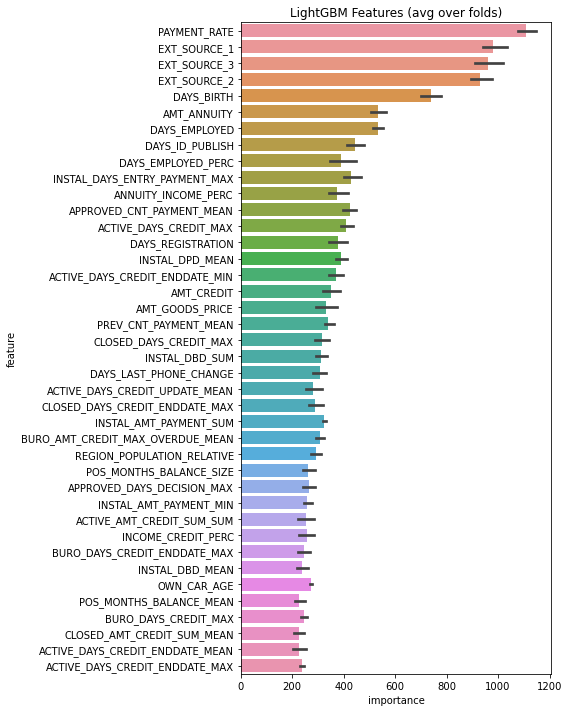

In [ ]:
feat_importance = kfold_lightgbm(df, num_folds= 5, stratified= False, debug= debug)

Train samples: 48744, test samples: 307511
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 14s
Previous applications df shape: (272478, 249)
Process previous_applications - done in 13s
Pos-cash balance df shape: (318858, 18)
Process POS-CASH balance - done in 7s
Installments payments df shape: (95291, 26)
Process installments payments - done in 7s
Credit card balance df shape: (101924, 141)
Process credit card balance - done in 10s
Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 798)
Training until validation scores don't improve for 200 rounds.
[200]	training's binary_logloss: 0.237548	training's auc: 0.788361	valid_1's binary_logloss: 0.248587	valid_1's auc: 0.768937
[400]	training's binary_logloss: 0.228623	training's auc: 0.811062	valid_1's binary_logloss: 0.245135	valid_1's auc: 0.778625
[600]	training's binary_logloss: 0.222695	training's auc: 0.826321	valid_1's binary_logloss: 0.244099	valid_1's auc: 0.781851
[800]	training's binary_

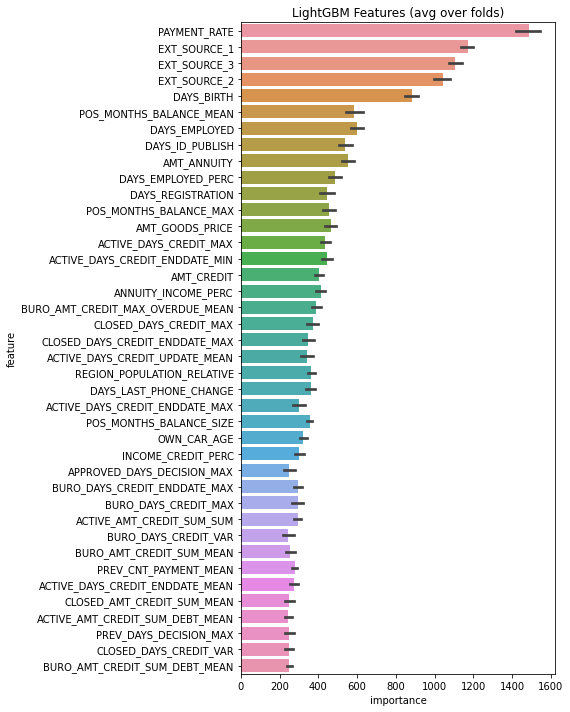

In [ ]:


@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))




# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(df, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    import re
    df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feature_importance_df)
    return feature_importance_df

# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')


def main(debug = False):
    num_rows = 10000 if debug else None
    df = application_train_test(num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
    with timer("Run LightGBM with kfold"):
        feat_importance = kfold_lightgbm(df, num_folds= 10, stratified= False, debug= debug)

if __name__ == "__main__":
    submission_file_name = "submission_kernel02.csv"
    with timer("Full model run"):
        main()

#### Check Target Column

In [ ]:
# target value counts per each class
print('Count of Each Class\n' + '-'*20)
print(df['TARGET'].value_counts())

Count of Each Class
--------------------
0.0    282682
1.0     24825
Name: TARGET, dtype: int64



La plupart des clients peuvent rembourser leurs prêts, et quelques-uns ont des difficultés, de sorte que les données sont déséquilibrées. Dans ce cas, nous devons garder à l'esprit 2 choses : les données doivent être équilibrées. accuracy n'est pas une mesure d'évaluation appropriée, elle sera trompeuse, mais les scores F1 ou ROC AUC sont appropriés dans ce cas.

In [ ]:
# all columns dtypes
df.dtypes.value_counts()

float64    622
uint8      133
int64       43
dtype: int64

In [11]:
# Only columns with NaNs count and percentage
columns = df.isnull().sum()[df.isnull().sum() != 0].keys()
nans_count = df.isnull().sum()[df.isnull().sum() != 0].values
nans_percentage = df.isnull().sum()[df.isnull().sum() != 0].values/df.shape[0]

# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
pd.set_option('display.max_rows', 617)
nans_df

,Column,No. of NaNs,% of NaNs in Column
415,REFUSED_AMT_DOWN_PAYMENT_MIN,303648,85.234287
416,REFUSED_AMT_DOWN_PAYMENT_MAX,303648,85.234287
417,REFUSED_AMT_DOWN_PAYMENT_MEAN,303648,85.234287
424,REFUSED_RATE_DOWN_PAYMENT_MIN,303648,85.234287
425,REFUSED_RATE_DOWN_PAYMENT_MAX,303648,85.234287
426,REFUSED_RATE_DOWN_PAYMENT_MEAN,303648,85.234287
414,REFUSED_APP_CREDIT_PERC_VAR,298034,83.658432
520,CC_AMT_PAYMENT_CURRENT_VAR,284649,79.901249
505,CC_AMT_DRAWINGS_OTHER_CURRENT_VAR,284559,79.875986
555,CC_CNT_DRAWINGS_OTHER_CURRENT_VAR,284559,79.875986


In [ ]:

        # clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
        #     eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

#### Décomposer la base de donnée en train et test 

In [12]:
train_df = df[df['TARGET'].notnull()]
test_df_for_application = df[df['TARGET'].isnull()]

#### Drop Columns with >60% NaNs

In [13]:
# extract these columns from nans_df
drop_cols = nans_df[nans_df['% of NaNs in Column']>60]['Column'].tolist()
keep_cols = [col for col in train_df.columns if col not in drop_cols]

# extract the new train dataframe
train_df = train_df[keep_cols]

# remove Target from keep_cols and create the new test dataframe
keep_cols.remove('TARGET')
test_df_for_application = test_df_for_application[keep_cols]

In [14]:
# check the new datasets shapes
print(train_df.shape)
print(test_df_for_application.shape)

(307507, 586)
(48744, 585)


**Data for dashboard**

In [ ]:
df_application_test_for_dashbord = df_application_test[['SK_ID_CURR','CODE_GENDER','FLAG_OWN_REALTY','AMT_INCOME_TOTAL','AMT_CREDIT','NAME_INCOME_TYPE','REGION_RATING_CLIENT','NAME_EDUCATION_TYPE']]

In [ ]:
df_application_test_for_dashbord = df_application_test_for_dashbord[:4000]

In [ ]:
df_application_test_for_dashbord

,SK_ID_CURR,CODE_GENDER,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,NAME_INCOME_TYPE,REGION_RATING_CLIENT,NAME_EDUCATION_TYPE
0,100001,F,Y,135000.0,568800.0,Working,2,Higher education
1,100005,M,Y,99000.0,222768.0,Working,2,Secondary / secondary special
2,100013,M,Y,202500.0,663264.0,Working,2,Higher education
3,100028,F,Y,315000.0,1575000.0,Working,2,Secondary / secondary special
4,100038,M,N,180000.0,625500.0,Working,2,Secondary / secondary special
...,...,...,...,...,...,...,...,...
3995,128464,F,N,90000.0,450000.0,Working,3,Secondary / secondary special
3996,128465,F,Y,270000.0,543037.5,Working,2,Higher education
3997,128471,F,N,90000.0,651960.0,Working,2,Secondary / secondary special
3998,128474,M,N,180000.0,334152.0,Working,3,Secondary / secondary special


In [ ]:
path = r'/content/df_application_test_for_dashbord.pickle'
f = open(path, 'wb')
pickle.dump(df_application_test_for_dashbord, f)
f.close()

**Data transformation** 

In [15]:
# create a pipeline to deal with numerical features
## 1- impute with median as most of features cotain outliers
## 2- apply Min-Max Scaler get rid of the outliers
numeric_transformer = Pipeline(
    steps=[("num_imputer", SimpleImputer(strategy="median")), ("scaler", MinMaxScaler())])

In [16]:
# create a column transformer instant
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, make_column_selector(dtype_exclude="object"))])

#### Data Splitting

In [17]:
train_df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [18]:
train_df.reset_index(drop=True, inplace= True)

In [19]:
from sklearn.pipeline import make_pipeline
model = make_pipeline(preprocessor)


In [20]:
# separate target out of features 
X = train_df.drop('TARGET', axis=1)
y = train_df['TARGET']

In [21]:
counter = Counter(y)
print(counter)

Counter({0.0: 282682, 1.0: 24825})


In [ ]:
# X1 = model.fit_transform(X)
# model.score(X_testt , X_test)

In [22]:
X_ = pd.DataFrame(model.fit_transform(X), columns=X.columns, index=X.index)

In [23]:
# data splitting
X_train, X_test, y_train, y_test = train_test_split(X_, y, train_size=0.8, stratify=y)

                                                        --------------------------------------------------

# Fonctions d'évaluation des modèles

In [24]:
from sklearn.model_selection import RandomizedSearchCV
kfold = StratifiedKFold(n_splits=5, random_state=100, shuffle=True)
from sklearn.model_selection import cross_val_score
def cross_validation(x, y, model):
    result= cross_val_score(model, x, y, cv=kfold, scoring="roc_auc", n_jobs=-1)
    print("Score: %f" % result.mean())
    
    
                     #----------------------------------------------------------
def RndSrch_Tune(model, X, y, params):
    
    clf = RandomizedSearchCV(model, params, scoring ='roc_auc', cv = kfold, n_jobs=-1, random_state=100)
    clf.fit(X, y)
    print("best score is :" , clf.best_score_)
    print("best estimator is :" , clf.best_estimator_)
    print("best Params is :" , clf.best_params_)
    return (clf.best_score_)

In [25]:
# create a function for trained models evaluation
def evaluate_model(model_pipeline,X_train,X_test):
    # prediction
    train_pred = model_pipeline.predict(X_train)
    test_pred = model_pipeline.predict(X_test)
    
    train_pred_proba = model_pipeline.predict_proba(X_train)
    test_pred_proba = model_pipeline.predict_proba(X_test)
    
  
    
    # evaluations
    print('Training & Validation ROC AUC Scores:\n', '-'*40)
    print('Training   roc auc score= {:.4f}'.format(roc_auc_score(y_train, train_pred_proba[:, 1])))
    print('Validation roc auc score= {:.4f}'.format(roc_auc_score(y_test, test_pred_proba[:, 1])))
    print('')
    print('Training & Validation Confusion Metrices:')
    print('Training   confusion matrix:\n', confusion_matrix(y_train, train_pred))
    print('Validation confusion matrix:\n', confusion_matrix(y_test, test_pred))
    

In [26]:
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import plot_confusion_matrix, ConfusionMatrixDisplay
def model_score(y,y_pred):         #Fonction qui renvoie plusieurs statistiques entre nos prédictions et nos données tests
    # prec = metrics.precision_score(y,y_pred, average= 'macro')
    # sens = metrics.recall_score(y,y_pred, average= 'macro')
    prec = metrics.precision_score(y,y_pred)
    sens = metrics.recall_score(y,y_pred)
    f_1 = 2*(prec*sens)/(prec+sens)
    print('Précision:', np.round(prec,4))
    print('Sensitivité:',np.round(sens,4))
    # print('F1:', np.round(f_1,2))
    return

## **LGBMClassifier**

In [27]:
kfold_lgbm = StratifiedKFold(n_splits=5, random_state=100, shuffle=True)
from sklearn.model_selection import cross_val_score
def cross_validation_lgbm(x, y, model):
    result= cross_val_score(model, x, y, cv=kfold_lgbm, scoring="roc_auc", n_jobs=-1)
    print("Score: %f" % result.mean())

In [28]:
clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )



In [ ]:
scores_clf = cross_validation_lgbm(X_train, y_train, clf)


Score: 0.772308


In [29]:
clf_fit = clf.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

Training until validation scores don't improve for 200 rounds.
[200]	training's binary_logloss: 0.236022	training's auc: 0.795436	valid_1's binary_logloss: 0.243708	valid_1's auc: 0.771351
[400]	training's binary_logloss: 0.22621	training's auc: 0.819158	valid_1's binary_logloss: 0.239985	valid_1's auc: 0.780725
[600]	training's binary_logloss: 0.219871	training's auc: 0.835001	valid_1's binary_logloss: 0.238646	valid_1's auc: 0.784491
[800]	training's binary_logloss: 0.214573	training's auc: 0.847997	valid_1's binary_logloss: 0.238092	valid_1's auc: 0.786015
[1000]	training's binary_logloss: 0.209925	training's auc: 0.859084	valid_1's binary_logloss: 0.237818	valid_1's auc: 0.786834
[1200]	training's binary_logloss: 0.20577	training's auc: 0.868614	valid_1's binary_logloss: 0.237697	valid_1's auc: 0.787115
Early stopping, best iteration is:
[1171]	training's binary_logloss: 0.206369	training's auc: 0.867251	valid_1's binary_logloss: 0.237703	valid_1's auc: 0.787147


In [ ]:
import joblib
clf_fit_filename = '/content/clf_fit.joblib'
joblib.dump(clf_fit, clf_fit_filename) 

['/content/clf_fit.joblib']

In [ ]:
evaluate_model(clf_fit,X_train,X_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.9007
Validation roc auc score= 0.7923

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[  2412  17448]
 [   302 225843]]
Validation confusion matrix:
 [[  256  4709]
 [  238 56299]]


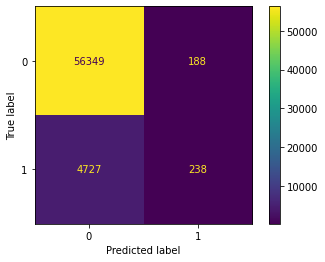

In [ ]:
plot_confusion_matrix(clf_fit, X_test, y_test, labels= [0,1])

In [30]:
ypred_lgbm = clf.predict(X_test)

In [ ]:
model_score(y_test,ypred_lgbm)

Précision: 0.532
Sensitivité: 0.0485


In [31]:
feature_importance_lgbm =['ACTIVE_DAYS_CREDIT_ENDDATE_MAX','ACTIVE_DAYS_CREDIT_ENDDATE_MEAN','CLOSED_AMT_CREDIT_SUM_MEAN','BURO_DAYS_CREDIT_MAX','POS_MONTHS_BALANCE_MEAN','INSTAL_DBD_MEAN','BURO_DAYS_CREDIT_ENDDATE_MAX','INCOME_CREDIT_PERC','ACTIVE_AMT_CREDIT_SUM_SUM','INSTAL_AMT_PAYMENT_MIN','APPROVED_DAYS_DECISION_MAX','POS_MONTHS_BALANCE_SIZE','REGION_POPULATION_RELATIVE','BURO_AMT_CREDIT_MAX_OVERDUE_MEAN','INSTAL_AMT_PAYMENT_SUM','CLOSED_DAYS_CREDIT_ENDDATE_MAX','ACTIVE_DAYS_CREDIT_UPDATE_MEAN','DAYS_LAST_PHONE_CHANGE','INSTAL_DBD_SUM','CLOSED_DAYS_CREDIT_MAX','PREV_CNT_PAYMENT_MEAN','AMT_GOODS_PRICE','AMT_CREDIT','ACTIVE_DAYS_CREDIT_ENDDATE_MIN','INSTAL_DPD_MEAN','DAYS_REGISTRATION','ACTIVE_DAYS_CREDIT_MAX','APPROVED_CNT_PAYMENT_MEAN','ANNUITY_INCOME_PERC','INSTAL_DAYS_ENTRY_PAYMENT_MAX','DAYS_EMPLOYED_PERC','DAYS_ID_PUBLISH','DAYS_EMPLOYED','AMT_ANNUITY','DAYS_BIRTH','EXT_SOURCE_2','EXT_SOURCE_3','EXT_SOURCE_1','PAYMENT_RATE']

                                                           ------------------------------------------------------------------

# **Fonction coût métier**

**Fonction utilisée**

On va utiliser les hypothèses suivantes pour chaque candidat au crédit :  
- frais généraux pour chaque client : coût = 1.
- gain par client qui rembourse le crédit = 10 (les "True Negative")(octroi de crédit à un client solvable).
- coût par client qui fait défaut = 100 (les "False Negative)(octroi de crédit à un client non-solvable).
- absence de coûts additionnels pour les "True Positive" (refus de crédit à un client non-solvable).
- absence de coûts additionnels pour les "False Positive" (refus de crédit à un client solvable).

$Coût = \frac{100*FN - 10*TN + 1*(TP+TN+FP+FN)}{TP+TN+FP+FN}$
  
  
Plutôt qu'utiliser une fonction coût, on va aussi travailler avec une fonction gain construite ainsi :  
  
$Gain = \frac{10*TN-100*FN-1*(TP+TN+FP+FN)}{TP+TN+FP+FN}$

Cette fonction de gain est bornée entre -101 (l'algo ne génère que des FP) et 9 (l'algo est parfait et ne génère que des TN).  

In [32]:
def gain_metier(TP, TN, FP, FN, gain_TN=10, cout_FN=100):
    return (gain_TN * TN - cout_FN * FN -
            (TP + TN + FP + FN)) / (TP + TN + FP + FN)

# **Optimisation de LGBM avec fonction de perte de l'algo = fonction de coût métier**

**<font color='green'>Ancien gain métier (valeur de référence, avec fonction de perte = 'logloss')</font>**




**Calcul de l'optimum sur le jeu d'entrainement**



**Détermination du seuil pour l'optimum sur le train set**



In [33]:
y_split_train_pred_proba = clf.predict_proba(X_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})

In [34]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [35]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 0.096
Valeur maximum de la fonction gain métier : 4.49


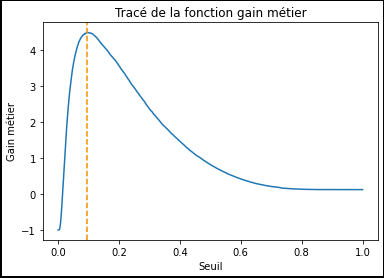

In [36]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()

In [29]:
import matplotlib

In [30]:
matplotlib.__version__

'3.2.2'

In [ ]:
pip install matplotlib==3.6.2

In [37]:

# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,179409,46736
Actual 1,4430,15430


 **Calcul de l'optimum sur le validation set**

In [38]:
y_split_valid_pred_proba = clf.predict_proba(X_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})


In [39]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [40]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)

Pour la valeur de seuil de 0.096 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.25.
Pour rappel : cet optimum est de 4.49 sur le train set.


In [41]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
precision = TP/(TP + FP)
recall = TP/(TP + FN)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,43947,12590
Actual 1,1781,3184


In [ ]:
print('precision =', precision)
print('recall =', recall)

precision = 0.21611537633637082
recall = 0.6066465256797583



<font color='green'>***Nouveau gain métier (avec fonction de perte customisée)***</font>

**Fonction de perte customisée**

In [42]:
my_verbose = True
cycle = 1
seuil_optimum = -999999.9
last_y_pred_pd = 0
external_gain_metier_max = -999999.9


def my_eval_metric(y_true, y_pred, test_unitaire=False):
    """C'est la fonction de perte de LGBM baséee sur la fonction coût métier.
    Args :
    - y_true : array-like of shape = [n_samples]. The target values.
    - y_pred : array-like of shape = [n_samples] or shape = [n_samples * n_classes] The predicted values. 
            In case of custom objective, predicted values are returned before any transformation, e.g. they are raw margin 
            instead of probability of positive class for binary task in this case.
    Returns : 
    - nom de la métrique (string).
    - loss value (float).
    - is_higher_better (booléen).
    Note : contrairement à ce qui est décrit dans la documentation de LGBM, y_pred est une proba (certe farfelue). 
        C'est le même score que celui retourné par la méthode predict_proba(raw_score=False).
    """

    global seuil_optimum, last_y_pred_pd, external_gain_metier_max
    y_pred_pd = pd.Series(y_pred)

    # Maximisation du gain_metier : on teste les seuils de proba et on retient celui qui donne le meilleur gain métier.
    gain_metier_max = -999999.9
    seuils = np.linspace(0.070, 0.110, 41) if not test_unitaire else [0]
    for seuil in seuils:
        # Calcul des TP / TN / FP / FN
        # conversion des raw margins en booléen (0 ou 1)
        y_pred_bool = (y_pred_pd > seuil).astype(int)
        TP = ((y_true == 1) & (y_pred_bool == 1)).sum()
        TN = ((y_true == 0) & (y_pred_bool == 0)).sum()
        FP = ((y_true == 0) & (y_pred_bool == 1)).sum()
        FN = ((y_true == 1) & (y_pred_bool == 0)).sum()
        # Calcul du gain métier
        gain = gain_metier(TP, TN, FP, FN)
        # copie des valeurs optimales
        if gain > gain_metier_max:
            gain_metier_max = gain
            seuil_optimum = seuil
            TN_optimum = TN
            FP_optimum = FP
            FN_optimum = FN
            TP_optimum = TP

    # print verbose
    if my_verbose:
        if test_unitaire:
            display(y_pred_pd)
            display(y_pred_bool)
        global cycle
        str_verbose = f"cycle = {cycle}, seuil_optimum = {round(seuil_optimum, 3)}, gain_metier_max = {round(gain_metier_max, 4)}"
        print(str_verbose)
        cycle += 1
        display(y_pred_pd.head(5))
        display(
            pd.DataFrame([[TN_optimum, FP_optimum], [FN_optimum, TP_optimum]],
                         columns=['Predicted 0', 'Predicted 1'],
                         index=['Actual 0', 'Actual 1']))

    # return
    external_gain_metier_max = gain_metier_max
    loss = -gain_metier_max
    is_higher_better = False

    return "ma_fonction_coût", loss, is_higher_better



**Fit du classifieur LGBM**

In [43]:
# fit d'un classifieur avec les paramètres par défaut de LGBM et la fonction de coût my_eval_metric
my_verbose = True
cycle = 1
clf_my_eval_metric = LGBMClassifier(verbose=100, n_estimators=100)

# attention : j'ai dû mettre un eval_set pour que eval_metric soit pris en compte (c'est aberrant, mais ça évite un bug) - à surveiller de près lors de la cross-validation
clf_my_eval_metric.fit(X_train,
                       y_train,
                       eval_metric=my_eval_metric,
                       verbose=100,
                       
                       eval_set=[(X_train, y_train)])


cycle = 1, seuil_optimum = 0.081, gain_metier_max = 2.4099


0    0.080160
1    0.076056
2    0.080160
3    0.084779
4    0.078230
dtype: float64

,Predicted 0,Predicted 1
Actual 0,160176,65969
Actual 1,7629,12231


cycle = 2, seuil_optimum = 0.083, gain_metier_max = 2.5487


0    0.082212
1    0.071306
2    0.077457
3    0.082992
4    0.076436
dtype: float64

,Predicted 0,Predicted 1
Actual 0,160490,65655
Actual 1,7319,12541


cycle = 3, seuil_optimum = 0.086, gain_metier_max = 2.6042


0    0.082917
1    0.066856
2    0.076684
3    0.082168
4    0.075672
dtype: float64

,Predicted 0,Predicted 1
Actual 0,170644,55501
Actual 1,8198,11662


cycle = 4, seuil_optimum = 0.086, gain_metier_max = 2.6183


0    0.082945
1    0.063098
2    0.073630
3    0.081883
4    0.072654
dtype: float64

,Predicted 0,Predicted 1
Actual 0,168432,57713
Actual 1,7942,11918


cycle = 5, seuil_optimum = 0.086, gain_metier_max = 2.6566


0    0.081862
1    0.059248
2    0.073271
3    0.080360
4    0.071290
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166054,60091
Actual 1,7610,12250


cycle = 6, seuil_optimum = 0.086, gain_metier_max = 2.6787


0    0.080707
1    0.055405
2    0.072513
3    0.076978
4    0.068582
dtype: float64

,Predicted 0,Predicted 1
Actual 0,165309,60836
Actual 1,7481,12379


cycle = 7, seuil_optimum = 0.086, gain_metier_max = 2.7174


0    0.081246
1    0.052065
2    0.070943
3    0.074130
4    0.066023
dtype: float64

,Predicted 0,Predicted 1
Actual 0,164510,61635
Actual 1,7306,12554


cycle = 8, seuil_optimum = 0.088, gain_metier_max = 2.7556


0    0.079998
1    0.049436
2    0.069978
3    0.079009
4    0.063386
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167460,58685
Actual 1,7507,12353


cycle = 9, seuil_optimum = 0.089, gain_metier_max = 2.7969


0    0.079880
1    0.047747
2    0.067459
3    0.077094
4    0.064369
dtype: float64

,Predicted 0,Predicted 1
Actual 0,168596,57549
Actual 1,7519,12341


cycle = 10, seuil_optimum = 0.091, gain_metier_max = 2.8394


0    0.079744
1    0.047508
2    0.067343
3    0.076962
4    0.061827
dtype: float64

,Predicted 0,Predicted 1
Actual 0,170972,55173
Actual 1,7652,12208


cycle = 11, seuil_optimum = 0.088, gain_metier_max = 2.8642


0    0.079925
1    0.048213
2    0.065970
3    0.078067
4    0.058833
dtype: float64

,Predicted 0,Predicted 1
Actual 0,165602,60543
Actual 1,7054,12806


cycle = 12, seuil_optimum = 0.091, gain_metier_max = 2.8811


0    0.078063
1    0.047872
2    0.064411
3    0.076246
4    0.065177
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169518,56627
Actual 1,7404,12456


cycle = 13, seuil_optimum = 0.087, gain_metier_max = 2.9042


0    0.076511
1    0.048555
2    0.063671
3    0.075177
4    0.064429
dtype: float64

,Predicted 0,Predicted 1
Actual 0,163776,62369
Actual 1,6773,13087


cycle = 14, seuil_optimum = 0.089, gain_metier_max = 2.9421


0    0.074768
1    0.048597
2    0.065582
3    0.075479
4    0.062885
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166757,59388
Actual 1,6978,12882


cycle = 15, seuil_optimum = 0.091, gain_metier_max = 2.9706


0    0.073219
1    0.046830
2    0.062891
3    0.077160
4    0.062000
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169529,56616
Actual 1,7185,12675


cycle = 16, seuil_optimum = 0.089, gain_metier_max = 2.9905


0    0.073679
1    0.045713
2    0.060563
3    0.077642
4    0.062231
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167119,59026
Actual 1,6895,12965


cycle = 17, seuil_optimum = 0.088, gain_metier_max = 3.0326


0    0.073395
1    0.044525
2    0.059084
3    0.078670
4    0.062755
dtype: float64

,Predicted 0,Predicted 1
Actual 0,165884,60261
Actual 1,6668,13192


cycle = 18, seuil_optimum = 0.087, gain_metier_max = 3.043


0    0.076620
1    0.044316
2    0.058541
3    0.080496
4    0.062181
dtype: float64

,Predicted 0,Predicted 1
Actual 0,164680,61465
Actual 1,6522,13338


cycle = 19, seuil_optimum = 0.088, gain_metier_max = 3.0687


0    0.074439
1    0.044142
2    0.058189
3    0.080279
4    0.061943
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166242,59903
Actual 1,6615,13245


cycle = 20, seuil_optimum = 0.089, gain_metier_max = 3.091


0    0.071283
1    0.044431
2    0.056974
3    0.078557
4    0.062001
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167471,58674
Actual 1,6683,13177


cycle = 21, seuil_optimum = 0.087, gain_metier_max = 3.1062


0    0.074397
1    0.042880
2    0.056516
3    0.077940
4    0.060956
dtype: float64

,Predicted 0,Predicted 1
Actual 0,165214,60931
Actual 1,6420,13440


cycle = 22, seuil_optimum = 0.088, gain_metier_max = 3.1348


0    0.075677
1    0.042483
2    0.054643
3    0.079275
4    0.061033
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166757,59388
Actual 1,6504,13356


cycle = 23, seuil_optimum = 0.089, gain_metier_max = 3.1615


0    0.073590
1    0.042378
2    0.055753
3    0.080843
4    0.062333
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167876,58269
Actual 1,6550,13310


cycle = 24, seuil_optimum = 0.088, gain_metier_max = 3.1778


0    0.073066
1    0.042097
2    0.054241
3    0.079703
4    0.061654
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166897,59248
Actual 1,6412,13448


cycle = 25, seuil_optimum = 0.089, gain_metier_max = 3.1843


0    0.072349
1    0.041670
2    0.052683
3    0.078926
4    0.063848
dtype: float64

,Predicted 0,Predicted 1
Actual 0,168125,58020
Actual 1,6519,13341


cycle = 26, seuil_optimum = 0.088, gain_metier_max = 3.1997


0    0.074658
1    0.041137
2    0.050780
3    0.082515
4    0.063902
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167285,58860
Actual 1,6397,13463


cycle = 27, seuil_optimum = 0.087, gain_metier_max = 3.2208


0    0.074347
1    0.041604
2    0.049747
3    0.082142
4    0.062239
dtype: float64

,Predicted 0,Predicted 1
Actual 0,166313,59832
Actual 1,6248,13612


cycle = 28, seuil_optimum = 0.088, gain_metier_max = 3.2393


0    0.072676
1    0.042104
2    0.048600
3    0.080312
4    0.062102
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167518,58627
Actual 1,6323,13537


cycle = 29, seuil_optimum = 0.09, gain_metier_max = 3.2582


0    0.072081
1    0.041702
2    0.046760
3    0.081392
4    0.061202
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169675,56470
Actual 1,6492,13368


cycle = 30, seuil_optimum = 0.088, gain_metier_max = 3.2702


0    0.072378
1    0.042824
2    0.044978
3    0.081725
4    0.060018
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167689,58456
Actual 1,6264,13596


cycle = 31, seuil_optimum = 0.09, gain_metier_max = 3.2956


0    0.074011
1    0.042677
2    0.044824
3    0.079581
4    0.059816
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169923,56222
Actual 1,6425,13435


cycle = 32, seuil_optimum = 0.092, gain_metier_max = 3.3069


0    0.075235
1    0.043459
2    0.043892
3    0.082983
4    0.058813
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171943,54202
Actual 1,6599,13261


cycle = 33, seuil_optimum = 0.087, gain_metier_max = 3.3112


0    0.074417
1    0.043375
2    0.043808
3    0.085490
4    0.058702
dtype: float64

,Predicted 0,Predicted 1
Actual 0,167187,58958
Actual 1,6113,13747


cycle = 34, seuil_optimum = 0.091, gain_metier_max = 3.3294


0    0.073100
1    0.042582
2    0.042944
3    0.083994
4    0.060761
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171255,54890
Actual 1,6475,13385


cycle = 35, seuil_optimum = 0.09, gain_metier_max = 3.3434


0    0.072070
1    0.041962
2    0.042187
3    0.082825
4    0.059709
dtype: float64

,Predicted 0,Predicted 1
Actual 0,170310,55835
Actual 1,6346,13514


cycle = 36, seuil_optimum = 0.093, gain_metier_max = 3.3517


0    0.071590
1    0.042756
2    0.040282
3    0.082280
4    0.058865
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173164,52981
Actual 1,6611,13249


cycle = 37, seuil_optimum = 0.091, gain_metier_max = 3.3687


0    0.071330
1    0.042364
2    0.039917
3    0.085017
4    0.057595
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171443,54702
Actual 1,6397,13463


cycle = 38, seuil_optimum = 0.088, gain_metier_max = 3.3791


0    0.070185
1    0.042345
2    0.040222
3    0.086389
4    0.056657
dtype: float64

,Predicted 0,Predicted 1
Actual 0,168617,57528
Actual 1,6089,13771


cycle = 39, seuil_optimum = 0.089, gain_metier_max = 3.3921


0    0.068441
1    0.042850
2    0.040205
3    0.085454
4    0.055230
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169718,56427
Actual 1,6167,13693


cycle = 40, seuil_optimum = 0.088, gain_metier_max = 3.4086


0    0.067281
1    0.042354
2    0.039739
3    0.085343
4    0.054599
dtype: float64

,Predicted 0,Predicted 1
Actual 0,168883,57262
Actual 1,6043,13817


cycle = 41, seuil_optimum = 0.092, gain_metier_max = 3.4184


0    0.067517
1    0.043950
2    0.038835
3    0.084180
4    0.054417
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172545,53600
Actual 1,6385,13475


cycle = 42, seuil_optimum = 0.093, gain_metier_max = 3.4376


0    0.069124
1    0.043445
2    0.038987
3    0.084494
4    0.055935
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173526,52619
Actual 1,6436,13424


cycle = 43, seuil_optimum = 0.093, gain_metier_max = 3.4412


0    0.071023
1    0.042942
2    0.038546
3    0.083528
4    0.055470
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173616,52529
Actual 1,6436,13424


cycle = 44, seuil_optimum = 0.094, gain_metier_max = 3.4546


0    0.071177
1    0.043038
2    0.038132
3    0.084172
4    0.057095
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174425,51720
Actual 1,6484,13376


cycle = 45, seuil_optimum = 0.095, gain_metier_max = 3.4624


0    0.070741
1    0.042645
2    0.038347
3    0.084624
4    0.057411
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175267,50878
Actual 1,6549,13311


cycle = 46, seuil_optimum = 0.091, gain_metier_max = 3.4708


0    0.069989
1    0.042241
2    0.037731
3    0.083857
4    0.056875
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171943,54202
Actual 1,6196,13664


cycle = 47, seuil_optimum = 0.091, gain_metier_max = 3.4773


0    0.069581
1    0.041988
2    0.037051
3    0.082098
4    0.056717
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172055,54090
Actual 1,6191,13669


cycle = 48, seuil_optimum = 0.092, gain_metier_max = 3.4916


0    0.071620
1    0.041810
2    0.036483
3    0.082277
4    0.057207
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172965,53180
Actual 1,6247,13613


cycle = 49, seuil_optimum = 0.091, gain_metier_max = 3.5019


0    0.071183
1    0.041546
2    0.035524
3    0.079466
4    0.056852
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172218,53927
Actual 1,6147,13713


cycle = 50, seuil_optimum = 0.092, gain_metier_max = 3.5126


0    0.070231
1    0.041166
2    0.035951
3    0.080317
4    0.055815
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173152,52993
Actual 1,6214,13646


cycle = 51, seuil_optimum = 0.088, gain_metier_max = 3.5153


0    0.070370
1    0.042288
2    0.035859
3    0.080828
4    0.055162
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169679,56466
Actual 1,5860,14000


cycle = 52, seuil_optimum = 0.093, gain_metier_max = 3.5262


0    0.071209
1    0.041889
2    0.035951
3    0.082639
4    0.055401
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173978,52167
Actual 1,6263,13597


cycle = 53, seuil_optimum = 0.092, gain_metier_max = 3.5317


0    0.070765
1    0.041221
2    0.035374
3    0.082487
4    0.054529
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173233,52912
Actual 1,6175,13685


cycle = 54, seuil_optimum = 0.088, gain_metier_max = 3.5495


0    0.071232
1    0.042198
2    0.034934
3    0.081287
4    0.055680
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169909,56236
Actual 1,5799,14061


cycle = 55, seuil_optimum = 0.087, gain_metier_max = 3.5573


0    0.071691
1    0.042184
2    0.034696
3    0.081986
4    0.054786
dtype: float64

,Predicted 0,Predicted 1
Actual 0,169152,56993
Actual 1,5704,14156


cycle = 56, seuil_optimum = 0.088, gain_metier_max = 3.5641


0    0.071711
1    0.041713
2    0.034815
3    0.082610
4    0.054622
dtype: float64

,Predicted 0,Predicted 1
Actual 0,170060,56085
Actual 1,5778,14082


cycle = 57, seuil_optimum = 0.09, gain_metier_max = 3.5702


0    0.072581
1    0.041345
2    0.034741
3    0.081913
4    0.054146
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171829,54316
Actual 1,5940,13920


cycle = 58, seuil_optimum = 0.091, gain_metier_max = 3.5801


0    0.073877
1    0.041564
2    0.033983
3    0.081453
4    0.054429
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172762,53383
Actual 1,6009,13851


cycle = 59, seuil_optimum = 0.088, gain_metier_max = 3.5934


0    0.072545
1    0.041613
2    0.034298
3    0.080953
4    0.053427
dtype: float64

,Predicted 0,Predicted 1
Actual 0,170270,55875
Actual 1,5727,14133


cycle = 60, seuil_optimum = 0.092, gain_metier_max = 3.6039


0    0.071669
1    0.041552
2    0.034003
3    0.080839
4    0.052588
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173679,52466
Actual 1,6042,13818


cycle = 61, seuil_optimum = 0.091, gain_metier_max = 3.6194


0    0.070528
1    0.040869
2    0.034201
3    0.079550
4    0.053229
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172880,53265
Actual 1,5924,13936


cycle = 62, seuil_optimum = 0.092, gain_metier_max = 3.6297


0    0.070857
1    0.040911
2    0.034067
3    0.078207
4    0.053023
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173794,52351
Actual 1,5990,13870


cycle = 63, seuil_optimum = 0.091, gain_metier_max = 3.6427


0    0.070921
1    0.040949
2    0.033259
3    0.078276
4    0.053072
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172983,53162
Actual 1,5877,13983


cycle = 64, seuil_optimum = 0.091, gain_metier_max = 3.6501


0    0.071402
1    0.041235
2    0.032475
3    0.076513
4    0.053439
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173015,53130
Actual 1,5862,13998


cycle = 65, seuil_optimum = 0.091, gain_metier_max = 3.655


0    0.071676
1    0.041249
2    0.033111
3    0.076806
4    0.053103
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173115,53030
Actual 1,5860,14000


cycle = 66, seuil_optimum = 0.09, gain_metier_max = 3.666


0    0.072150
1    0.040691
2    0.031827
3    0.076931
4    0.052099
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172347,53798
Actual 1,5756,14104


cycle = 67, seuil_optimum = 0.09, gain_metier_max = 3.6744


0    0.071982
1    0.040434
2    0.031424
3    0.076753
4    0.051976
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172382,53763
Actual 1,5739,14121


cycle = 68, seuil_optimum = 0.09, gain_metier_max = 3.6864


0    0.071734
1    0.039889
2    0.031192
3    0.076212
4    0.050894
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172407,53738
Actual 1,5712,14148


cycle = 69, seuil_optimum = 0.091, gain_metier_max = 3.6936


0    0.072398
1    0.039264
2    0.031002
3    0.076350
4    0.051368
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173306,52839
Actual 1,5784,14076


cycle = 70, seuil_optimum = 0.09, gain_metier_max = 3.7049


0    0.073313
1    0.039382
2    0.030548
3    0.076569
4    0.051519
dtype: float64

,Predicted 0,Predicted 1
Actual 0,172524,53621
Actual 1,5678,14182


cycle = 71, seuil_optimum = 0.089, gain_metier_max = 3.7084


0    0.074776
1    0.039199
2    0.030784
3    0.076888
4    0.051284
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171719,54426
Actual 1,5589,14271


cycle = 72, seuil_optimum = 0.089, gain_metier_max = 3.7152


0    0.075169
1    0.039414
2    0.030340
3    0.075831
4    0.051561
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171776,54369
Actual 1,5578,14282


cycle = 73, seuil_optimum = 0.092, gain_metier_max = 3.7241


0    0.075198
1    0.039350
2    0.029702
3    0.072438
4    0.051478
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174204,51941
Actual 1,5799,14061


cycle = 74, seuil_optimum = 0.093, gain_metier_max = 3.7382


0    0.075714
1    0.039333
2    0.029607
3    0.072408
4    0.051457
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174993,51152
Actual 1,5843,14017


cycle = 75, seuil_optimum = 0.094, gain_metier_max = 3.7454


0    0.075277
1    0.038601
2    0.029251
3    0.073268
4    0.051563
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175738,50407
Actual 1,5900,13960


cycle = 76, seuil_optimum = 0.093, gain_metier_max = 3.7464


0    0.075564
1    0.038318
2    0.029035
3    0.072351
4    0.051190
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175045,51100
Actual 1,5828,14032


cycle = 77, seuil_optimum = 0.094, gain_metier_max = 3.7594


0    0.075879
1    0.038484
2    0.029162
3    0.073479
4    0.050158
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175843,50302
Actual 1,5876,13984


cycle = 78, seuil_optimum = 0.095, gain_metier_max = 3.763


0    0.076217
1    0.038663
2    0.029231
3    0.073161
4    0.050943
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176561,49584
Actual 1,5939,13921


cycle = 79, seuil_optimum = 0.094, gain_metier_max = 3.7706


0    0.076452
1    0.038508
2    0.027832
3    0.073781
4    0.051385
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175870,50275
Actual 1,5851,14009


cycle = 80, seuil_optimum = 0.088, gain_metier_max = 3.7751


0    0.076719
1    0.038648
2    0.027518
3    0.073653
4    0.051162
dtype: float64

,Predicted 0,Predicted 1
Actual 0,171230,54915
Actual 1,5376,14484


cycle = 81, seuil_optimum = 0.094, gain_metier_max = 3.7857


0    0.077185
1    0.038603
2    0.026945
3    0.073420
4    0.052098
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175991,50154
Actual 1,5826,14034


cycle = 82, seuil_optimum = 0.091, gain_metier_max = 3.7936


0    0.076593
1    0.038699
2    0.026595
3    0.073597
4    0.052227
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173746,52399
Actual 1,5582,14278


cycle = 83, seuil_optimum = 0.091, gain_metier_max = 3.802


0    0.075705
1    0.038689
2    0.026759
3    0.073871
4    0.050205
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173771,52374
Actual 1,5564,14296


cycle = 84, seuil_optimum = 0.091, gain_metier_max = 3.8088


0    0.075605
1    0.038648
2    0.027119
3    0.073772
4    0.050136
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173758,52387
Actual 1,5546,14314


cycle = 85, seuil_optimum = 0.091, gain_metier_max = 3.8226


0    0.075966
1    0.037680
2    0.026810
3    0.072933
4    0.050151
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173869,52276
Actual 1,5523,14337


cycle = 86, seuil_optimum = 0.092, gain_metier_max = 3.83


0    0.076400
1    0.037571
2    0.026663
3    0.072730
4    0.049884
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174640,51505
Actual 1,5582,14278


cycle = 87, seuil_optimum = 0.092, gain_metier_max = 3.843


0    0.074862
1    0.037580
2    0.026991
3    0.071594
4    0.050482
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174670,51475
Actual 1,5553,14307


cycle = 88, seuil_optimum = 0.092, gain_metier_max = 3.8513


0    0.075020
1    0.037663
2    0.026932
3    0.071444
4    0.050592
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174715,51430
Actual 1,5537,14323


cycle = 89, seuil_optimum = 0.091, gain_metier_max = 3.8594


0    0.075460
1    0.037589
2    0.026878
3    0.071309
4    0.050494
dtype: float64

,Predicted 0,Predicted 1
Actual 0,173984,52161
Actual 1,5444,14416


cycle = 90, seuil_optimum = 0.092, gain_metier_max = 3.8673


0    0.075409
1    0.038095
2    0.026499
3    0.071261
4    0.050459
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174767,51378
Actual 1,5503,14357


cycle = 91, seuil_optimum = 0.092, gain_metier_max = 3.8794


0    0.075322
1    0.038049
2    0.026466
3    0.071943
4    0.050399
dtype: float64

,Predicted 0,Predicted 1
Actual 0,174805,51340
Actual 1,5477,14383


cycle = 92, seuil_optimum = 0.093, gain_metier_max = 3.8864


0    0.074874
1    0.038194
2    0.026576
3    0.072206
4    0.050588
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175588,50557
Actual 1,5538,14322


cycle = 93, seuil_optimum = 0.094, gain_metier_max = 3.8935


0    0.074419
1    0.038323
2    0.026616
3    0.072928
4    0.051106
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176333,49812
Actual 1,5595,14265


cycle = 94, seuil_optimum = 0.094, gain_metier_max = 3.9047


0    0.074447
1    0.038337
2    0.026626
3    0.072955
4    0.050908
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176367,49778
Actual 1,5571,14289


cycle = 95, seuil_optimum = 0.094, gain_metier_max = 3.9149


0    0.074644
1    0.038151
2    0.026495
3    0.072390
4    0.050664
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176359,49786
Actual 1,5545,14315


cycle = 96, seuil_optimum = 0.093, gain_metier_max = 3.9183


0    0.076108
1    0.038931
2    0.026478
3    0.072345
4    0.050631
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175653,50492
Actual 1,5466,14394


cycle = 97, seuil_optimum = 0.094, gain_metier_max = 3.9295


0    0.076417
1    0.038889
2    0.026449
3    0.072975
4    0.050577
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176418,49727
Actual 1,5515,14345


cycle = 98, seuil_optimum = 0.093, gain_metier_max = 3.9408


0    0.076630
1    0.038748
2    0.026527
3    0.072720
4    0.050397
dtype: float64

,Predicted 0,Predicted 1
Actual 0,175745,50400
Actual 1,5420,14440


cycle = 99, seuil_optimum = 0.094, gain_metier_max = 3.941


0    0.075770
1    0.038449
2    0.026605
3    0.072987
4    0.050288
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176480,49665
Actual 1,5493,14367


cycle = 100, seuil_optimum = 0.094, gain_metier_max = 3.9474


0    0.075987
1    0.037942
2    0.026249
3    0.073091
4    0.049151
dtype: float64

,Predicted 0,Predicted 1
Actual 0,176478,49667
Actual 1,5477,14383


[100]	training's binary_logloss: 0.221611	training's ma_fonction_coût: -3.94738


LGBMClassifier(verbose=100)

In [44]:
print("seuil_optimum (proba) :", round(seuil_optimum, 3))

seuil_optimum (proba) : 0.094


**Nouveau gain métier**

**Vérification sur X_train**

In [45]:
y_split_train_pred_proba = clf_my_eval_metric.predict_proba(X_train)
y_split_train_pred_proba

array([[0.92401251, 0.07598749],
       [0.96205796, 0.03794204],
       [0.97375054, 0.02624946],
       ...,
       [0.86242205, 0.13757795],
       [0.98535102, 0.01464898],
       [0.97694513, 0.02305487]])

In [46]:
y_split_train_pred_proba = clf_my_eval_metric.predict_proba(X_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})

print("Les 20 scores les plus élevés :")
display(train_set_pred_proba.sort_values(by='pred_proba').tail(20))

Les 20 scores les plus élevés :


,SK_ID_CURR,pred_proba,TARGET_True
119542,119542,0.765741,1
233454,233454,0.766061,1
47287,47287,0.766884,1
209772,209772,0.768442,1
61884,61884,0.769389,1
62723,62723,0.770803,1
50410,50410,0.771118,1
77249,77249,0.771745,1
160276,160276,0.774206,1
295349,295349,0.774788,1


In [47]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [48]:
print("seuil_optimum : ", round(seuil_optimum, 3))

TP, TN, FP, FN, gain = gain_modelise(seuil_optimum, verbose=True)

print("Gain métier :", round(gain, 3))

display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

seuil_optimum :  0.094
Gain métier : 3.947


,Predicted 0,Predicted 1
Actual 0,176478,49667
Actual 1,5477,14383


**Calcul sur X_split_valid**

In [49]:
y_split_valid_pred_proba = clf_my_eval_metric.predict_proba(X_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})

display(validation_set_pred_proba)

,SK_ID_CURR,pred_proba,TARGET_True
85556,85556,0.078965,1
223083,223083,0.047366,0
226402,226402,0.199789,1
185529,185529,0.199252,0
62126,62126,0.016112,0
...,...,...,...
271864,271864,0.036031,0
162271,162271,0.065020,0
147122,147122,0.051827,0
101992,101992,0.021078,0


In [50]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [51]:
print("seuil_optimum (proba) : ", round(seuil_optimum, 3))

TP, TN, FP, FN, gain = gain_modelise(seuil_optimum, verbose=True)

print("Gain métier :", round(gain, 3))

display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


seuil_optimum (proba) :  0.094
Gain métier : 3.171


,Predicted 0,Predicted 1
Actual 0,43502,13035
Actual 1,1785,3180


### Gain métier calculé à l'issue de l'optimisation du classifieur

In [52]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))


Seuil qui conduit au maximum de la fonction gain métier : 0.082
Valeur maximum de la fonction gain métier : 3.19


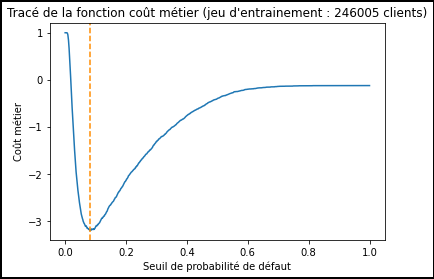

In [53]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, [-g for g in gains_modelises])
plt.xlabel('Seuil de probabilité de défaut')
plt.ylabel('Coût métier')
plt.title(
    f"Tracé de la fonction coût métier (jeu d'entrainement : {len(X_train)} clients)"
)
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()

In [64]:
# le répertoire  ./api_ml  est le repository de l'API.
import joblib
joblib.dump(seuil_optimum, '/content/seuil_optimum.joblib')

['/content/seuil_optimum.joblib']

In [ ]:
seuil_optimum = joblib.load('/content/seuil_optimum.joblib')
seuil_optimum

**Calcul du gain métier sur validation set**

In [54]:
def my_eval_metric_test_set(y_true, y_pred, seuil=0.5):
    """Cette fonction retourne le gain métier pour le test set (le seuil est un paramètre d'entrée).
    Args :
    - y_true : array-like of shape = [n_samples]. The target values.
    - y_pred : array-like of shape = [n_samples] or shape = [n_samples * n_classes] The predicted values. 
            In case of custom objective, predicted values are returned before any transformation, e.g. they are raw margin 
            instead of probability of positive class for binary task in this case.
    - seuil : float. La valeur de seuil pour True/False.
    Returns : 
    - gain métier (float).
    Note : contrairement à ce qui est décrit dans la documentation de LGBM, y_pred est une proba (certe farfelue). 
        C'est le même score que celui retourné par la méthode predict_proba(raw_score=False).
    """

    y_pred_pd = pd.Series(y_pred)

    # Calcul des TP / TN / FP / FN
    # conversion des raw margins en booléen (0 ou 1)
    y_pred_bool = (y_pred_pd > seuil).astype(int)
    TP = ((y_true == 1) & (y_pred_bool == 1)).sum()
    TN = ((y_true == 0) & (y_pred_bool == 0)).sum()
    FP = ((y_true == 0) & (y_pred_bool == 1)).sum()
    FN = ((y_true == 1) & (y_pred_bool == 0)).sum()
    # Calcul du gain métier
    gain = gain_metier(TP, TN, FP, FN)

    # print verbose
    if my_verbose:
        print("Matrice de confusion du test set :")
        display(
            pd.DataFrame([[TN, FP], [FN, TP]],
                         columns=['Predicted 0', 'Predicted 1'],
                         index=['Actual 0', 'Actual 1']))

    return gain

In [55]:
# fonction de gain my_eval_metric_test_set sur le test set
y_pred = clf_my_eval_metric.predict_proba(X_test)[:, 1]
gain_test = my_eval_metric_test_set(np.array(y_test), y_pred,
                                    seuil_optimum)
print("gain métier (validation set) :", gain_test)

Matrice de confusion du test set :


,Predicted 0,Predicted 1
Actual 0,43502,13035
Actual 1,1785,3180


gain métier (validation set) : 3.1709212708529804


In [56]:
y_split_valid_pred_proba = clf_my_eval_metric.predict_proba(X_test)

split_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})


In [57]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (split_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((split_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((split_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((split_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((split_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [58]:
seuils = np.linspace(0, 1, 1001)
gains_modelises_valid = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises_valid)
max_index = gains_modelises_valid.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))


Seuil qui conduit au maximum de la fonction gain métier : 0.082
Valeur maximum de la fonction gain métier : 3.19


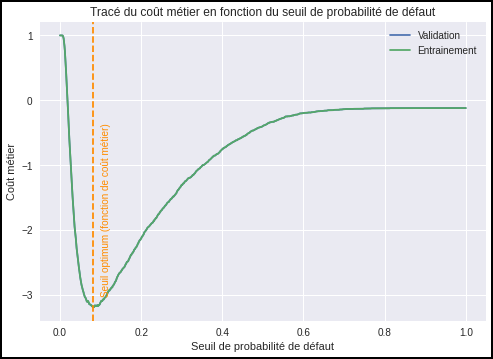

In [65]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, [-g for g in gains_modelises_valid], label="Validation")
plt.plot(seuils, [-g for g in gains_modelises], label="Entrainement")
plt.xlabel('Seuil de probabilité de défaut')
plt.ylabel('Coût métier')
# plt.title(f"Tracé de la fonction coût métier (jeu d'entrainement : {len(X_split_valid)} clients)")
plt.title(
    "Tracé du coût métier en fonction du seuil de probabilité de défaut")
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.annotate('Seuil optimum (fonction de coût métier)',
             color='darkorange',
             xy=(0.1, -3),
             rotation=90)
plt.legend()
plt.show()


**Distribution de predict_proba**

In [60]:
df_predictproba = pd.DataFrame({
    'y_predict_proba': y_pred,
    'y_true': y_test
})
df_predictproba

,y_predict_proba,y_true
85556,0.078965,1.0
223083,0.047366,0.0
226402,0.199789,1.0
185529,0.199252,0.0
62126,0.016112,0.0
...,...,...
271864,0.036031,0.0
162271,0.065020,0.0
147122,0.051827,0.0
101992,0.021078,0.0


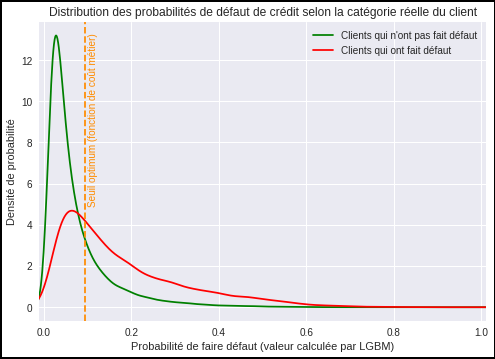

In [61]:
# valeurs de predict_proba des client y_true == 0
ser_predictproba_true0 = df_predictproba.loc[df_predictproba['y_true'] == 0,
                                             'y_predict_proba']
ser_predictproba_true1 = df_predictproba.loc[df_predictproba['y_true'] == 1,
                                             'y_predict_proba']

plt.style.use('seaborn')
plt.figure(edgecolor='black', linewidth=4)
plt.xlim(-0.01, 1.01)
bw_method = 0.15
ind = 1000
ser_predictproba_true0.plot(kind='kde',
                            c='g',
                            label='Clients qui n\'ont pas fait défaut',
                            bw_method=bw_method,
                            ind=ind)
ser_predictproba_true1.plot(kind='kde',
                            c='r',
                            label='Clients qui ont fait défaut',
                            bw_method=bw_method)
plt.title(
    'Distribution des probabilités de défaut de crédit selon la catégorie réelle du client'
)
plt.axline((seuil_optimum, 0), (seuil_optimum, 1), c='darkorange', ls='dashed')
plt.legend()
plt.xlabel('Probabilité de faire défaut (valeur calculée par LGBM)')
plt.ylabel('Densité de probabilité')
plt.annotate('Seuil optimum (fonction de coût métier)',
             color='darkorange',
             xy=(0.1, 5),
             rotation=90)
plt.show()


# **XGBClassifier**

In [ ]:
from collections import Counter
counter = Counter(y)
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 11.387


In [ ]:
# Value of hyperparameters for random search
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
param_xgbc = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
             'subsample':[1,0.5,0.2,0.1],
             'max_depth' : range(2,11,1),
             'n_estimators':range(50,300,50)}

RndSrch_Tune(XGBClassifier(random_state = 100, n_jobs=-1, scale_pos_weight=estimate), 
             X_train, y_train, param_xgbc)

best score is : 0.779499688026003
best estimator is : XGBClassifier(learning_rate=0.05, max_depth=6, n_estimators=250, n_jobs=-1,
              random_state=100, scale_pos_weight=11.386988922457201,
              subsample=0.5)
best Params is : {'subsample': 0.5, 'n_estimators': 250, 'max_depth': 6, 'learning_rate': 0.05}


0.779499688026003

In [ ]:
from xgboost import XGBClassifier
xgbc = XGBClassifier(learning_rate=0.2, 
                     max_depth=3, 
                     n_jobs=-1, 
                     random_state=100,
                     scale_pos_weight=11.39507299270073)

# scores_xgbc = cross_validation(X_train, y_train, xgbc)
# print(scores_xgbc)

In [ ]:
xgbc.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

[0]	validation_0-auc:0.688677	validation_1-auc:0.68549
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 200 rounds.
[99]	validation_0-auc:0.798791	validation_1-auc:0.774621


XGBClassifier(learning_rate=0.2, n_jobs=-1, random_state=100,
              scale_pos_weight=11.39507299270073)

In [ ]:
# xgbc.fit(X_train, y_train)
evaluate_model(xgbc,X_train,X_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.7988
Validation roc auc score= 0.7756

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[ 14457   5403]
 [ 63559 162586]]
Validation confusion matrix:
 [[ 3431  1534]
 [16019 40518]]


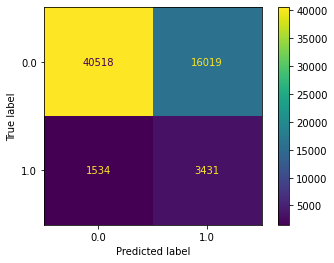

In [ ]:
plot_confusion_matrix(xgbc, X_test, y_test)

In [ ]:
ypred_xgbc = xgbc.predict(X_test)

In [ ]:
model_score(y_test,ypred_xgbc)


Précision: 0.57
Sensitivité: 0.7039


In [ ]:
model_score(y_test,ypred_xgbc)

Précision: 0.1776
Sensitivité: 0.6985


**Liste** **des** **variables** **importantes**

In [ ]:
# Feature importance XGboost 
feat_names = X_.columns
imp_vals = pd.DataFrame(list(xgbc.get_booster().get_fscore().items()))
feature_importance_xgbc = imp_vals[0].tolist()

In [ ]:
def get_xgb_imp(xgb, feat_names):
   
    imp_vals = pd.DataFrame(list(xgbc.get_booster().get_fscore().items()))
    print(imp_vals[0])

    imp_dict= {}
    print('feat_names', len(feat_names))
    for i in range(len(feat_names)):
      ValueSerie = imp_vals[imp_vals[0] == ('f'+ str(i))][1]
      # print('ValueSerie', len(ValueSerie))
      if len(ValueSerie) == 1 :
        imp_dict[feat_names[i]] = { 'feature': '_f'+ str(i), 'value': ValueSerie.iloc[0]}
        # print(feat_names[i] + '_f'+ str(i) , ValueSerie.iloc[0])      
    # print(imp_dict)
    return imp_dict

**Calcul de l'optimum sur le jeu d'entrainement**

Détermination du seuil pour l'optimum sur le train set :

In [ ]:
def gain_metier(TP, TN, FP, FN, gain_TN=10, cout_FN=100):
    return (gain_TN * TN - cout_FN * FN -
            (TP + TN + FP + FN)) / (TP + TN + FP + FN)

In [ ]:
y_split_train_pred_proba = xgbc.predict_proba(X_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [ ]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))


Seuil qui conduit au maximum de la fonction gain métier : 0.506
Valeur maximum de la fonction gain métier : 3.41


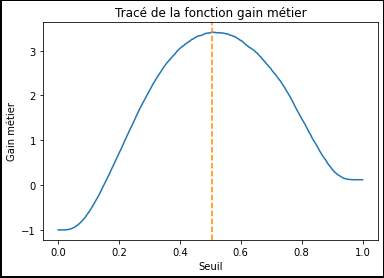

In [ ]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,164635,61510
Actual 1,5611,14249


Calcul de l'optimum sur le validation set

In [ ]:
y_split_valid_pred_proba = xgbc.predict_proba(X_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [ ]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)


Pour la valeur de seuil de 0.506 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.17.
Pour rappel : cet optimum est de 3.41 sur le train set.


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,41037,15500
Actual 1,1537,3428


In [ ]:
precision = TP/(TP + FP)
recall = TP/(TP + FN)


In [ ]:
print('precision = ',precision)

precision =  0.18110735418427726


In [ ]:
print('recall = ', recall)

recall =  0.6904330312185297


# **Adaboost** **classifier**

In [ ]:
# Value of hyperparameters for random search

param_ada = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
             'algorithm': ['SAMME', 'SAMME.R'],
             'n_estimators':range(50,300,50)}

RndSrch_Tune(AdaBoostClassifier(random_state = 100), X_train, y_train, param_ada)

best score is : 0.7540652176454232
best estimator is : AdaBoostClassifier(learning_rate=0.2, n_estimators=200, random_state=100)
best Params is : {'n_estimators': 200, 'learning_rate': 0.2, 'algorithm': 'SAMME.R'}


0.7540652176454232

In [ ]:
ada = AdaBoostClassifier(learning_rate=0.2, 
                         algorithm = 'SAMME.R',
                         n_estimators=200, 
                         random_state=100)
scores_ada = cross_validation(X_train, y_train, ada)
print(scores_ada)

Score: 0.768756
None


In [ ]:
ada = AdaBoostClassifier(learning_rate=0.2, 
                         algorithm = 'SAMME.R',
                         n_estimators=200, 
                         random_state=100)

In [ ]:
ada.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=0.2, n_estimators=200, random_state=100)

In [ ]:
# ada.fit(X_train, y_train)
evaluate_model(ada,X_train,X_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.7743
Validation roc auc score= 0.7592

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[225984    161]
 [ 19604    256]]
Validation confusion matrix:
 [[56494    43]
 [ 4913    52]]


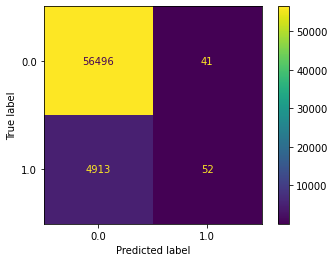

In [ ]:
plot_confusion_matrix(ada, X_test, y_test)

In [ ]:
ypred_ada = ada.predict(X_test)

In [ ]:
model_score(y_test,ypred_ada)

Précision: 0.7542
Sensitivité: 0.5057


In [ ]:
model_score(y_test,ypred_ada)

Précision: 0.5765
Sensitivité: 0.0099


In [ ]:

feat_imp_df_ada = pd.DataFrame(data = {"Nom des variables": X.columns,"Importance des variables":ada.feature_importances_})
feat_imp_df_ada = feat_imp_df_ada.sort_values("Importance des variables",ascending=False)[:]

# Applique la fonction valeur absolue à la colonne des coefficients
feat_imp_df_ada["Importance des variables"] = feat_imp_df_ada["Importance des variables"].apply(lambda x: abs(x)).sort_values(ascending = False) 

# Sélectionne les variables avec un coefficient nul
indexNames = feat_imp_df_ada[feat_imp_df_ada["Importance des variables"] == 0].index 

feat_imp_df_ada.drop(indexNames , inplace=True) # Supprime les variables avec un coefficient nul
feat_imp_df_ada.sort_values(ascending = False,by = "Importance des variables")

,Nom des variables,Importance des variables
32,EXT_SOURCE_2,0.075
33,EXT_SOURCE_3,0.055
230,PAYMENT_RATE,0.045
31,EXT_SOURCE_1,0.045
8,AMT_ANNUITY,0.040
580,INSTAL_AMT_PAYMENT_SUM,0.030
561,INSTAL_DPD_MEAN,0.030
2,CODE_GENDER,0.030
539,APPROVED_CNT_PAYMENT_MEAN,0.025
12,DAYS_EMPLOYED,0.025


 **Liste** **des** **variables** **importantes** 

In [ ]:
feature_importance_ada = list(feat_imp_df_ada['Nom des variables'])


**Calcul de l'optimum sur le jeu d'entrainement**

Détermination du seuil pour l'optimum sur le train set

In [ ]:
y_split_train_pred_proba = ada.predict_proba(X_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [ ]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 0.485
Valeur maximum de la fonction gain métier : 3.06


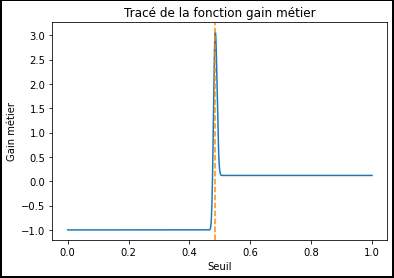

In [ ]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,162722,63423
Actual 1,6277,13583


Calcul de l'optimum sur le validation set

In [ ]:
y_split_valid_pred_proba = ada.predict_proba(X_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [ ]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)


Pour la valeur de seuil de 0.485 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.07.
Pour rappel : cet optimum est de 3.06 sur le train set.


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
precision = TP/(TP + FP)
recall = TP/(TP + FN)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,40581,15956
Actual 1,1552,3413


In [ ]:
print('precision = ',precision)

precision =  0.17620940678403635


In [ ]:
print('recall = ', recall)

recall =  0.687411883182276


# **models** **with** **feature** **importance**

**LGBMClassifier**


In [ ]:
X2 = X_[feature_importance_lgbm]

In [ ]:
X2 = pd.DataFrame(model.fit_transform(X2), columns=X2.columns, index=X2.index)

In [ ]:
# X2 = model.fit_transform(X2)

In [ ]:
# data splitting
X2_train, X2_test, y_train, y_test = train_test_split(X2, y, train_size=0.8, stratify=y)

In [ ]:
clf_imp = clf.fit(X2_train, y_train, eval_set=[(X2_train, y_train), (X2_test, y_test)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

Training until validation scores don't improve for 200 rounds.
[200]	training's auc: 0.782629	training's binary_logloss: 0.239707	valid_1's auc: 0.760032	valid_1's binary_logloss: 0.246261
[400]	training's auc: 0.801081	training's binary_logloss: 0.232685	valid_1's auc: 0.76787	valid_1's binary_logloss: 0.243496
[600]	training's auc: 0.814454	training's binary_logloss: 0.227886	valid_1's auc: 0.771003	valid_1's binary_logloss: 0.242451
[800]	training's auc: 0.825459	training's binary_logloss: 0.223893	valid_1's auc: 0.772384	valid_1's binary_logloss: 0.241984
[1000]	training's auc: 0.835176	training's binary_logloss: 0.220288	valid_1's auc: 0.773194	valid_1's binary_logloss: 0.241751
[1200]	training's auc: 0.844005	training's binary_logloss: 0.216946	valid_1's auc: 0.77364	valid_1's binary_logloss: 0.241603
[1400]	training's auc: 0.85162	training's binary_logloss: 0.213945	valid_1's auc: 0.773802	valid_1's binary_logloss: 0.241582
[1600]	training's auc: 0.859008	training's binary_loglo

In [ ]:
evaluate_model(clf_imp,X2_train,X2_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.8396
Validation roc auc score= 0.7798

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[225822    323]
 [ 18738   1122]]
Validation confusion matrix:
 [[56381   156]
 [ 4793   172]]


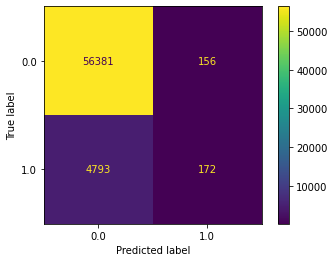

In [ ]:
plot_confusion_matrix(clf_imp, X2_test, y_test)

In [ ]:
ypred_clf_imp = clf_imp.predict(X2_test)

In [ ]:
model_score(y_test,ypred_clf_imp)

Précision: 0.7508
Sensitivité: 0.5168


In [ ]:
model_score(y_test,ypred_clf_imp)

Précision: 0.5172
Sensitivité: 0.0332


**Détermination du seuil pour l'optimum sur le train set**

In [ ]:
y_split_train_pred_proba = clf_imp.predict_proba(X2_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X2_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [ ]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))


Seuil qui conduit au maximum de la fonction gain métier : 0.096
Valeur maximum de la fonction gain métier : 4.21


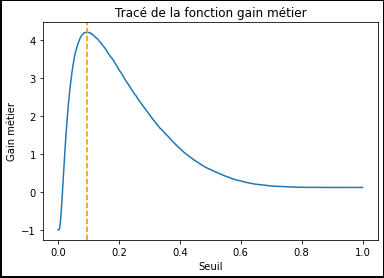

In [ ]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()

In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,176901,49244
Actual 1,4869,14991


**Calcul de l'optimum sur le validation set**

In [ ]:
y_split_valid_pred_proba = clf_imp.predict_proba(X2_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X2_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})



In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [ ]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)


Pour la valeur de seuil de 0.096 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.1.
Pour rappel : cet optimum est de 4.21 sur le train set.


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
precision = TP/(TP + FP)
recall = TP/(TP + FN)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,43557,12980
Actual 1,1835,3130


In [ ]:
print('precision = ',precision)
print('recall = ', recall)


precision =  0.19428926132836746
recall =  0.6304128902316214


**XGBClassifier**

In [ ]:
X3 = X_[feature_importance_xgbc]


In [ ]:
X3 = pd.DataFrame(model.fit_transform(X3), columns=X3.columns, index=X3.index)

In [ ]:
# X3 = model.fit_transform(X3)

In [ ]:
# data splitting
X3_train, X3_test, y_train, y_test = train_test_split(X3, y, train_size=0.8, stratify=y)

In [ ]:
xgbc_imp = xgbc.fit(X3_train, y_train, eval_set=[(X3_train, y_train), (X3_test, y_test)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

[0]	validation_0-auc:0.691623	validation_1-auc:0.680813
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 200 rounds.
[99]	validation_0-auc:0.797654	validation_1-auc:0.77738


In [ ]:
evaluate_model(xgbc_imp,X3_train,X3_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.7967
Validation roc auc score= 0.7820

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[162304  63841]
 [  5441  14419]]
Validation confusion matrix:
 [[40563 15974]
 [ 1483  3482]]


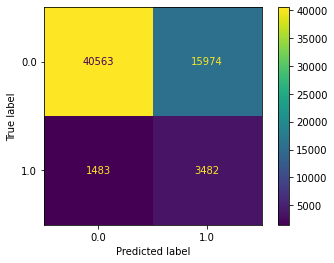

In [ ]:
plot_confusion_matrix(xgbc_imp, X3_test, y_test)

In [ ]:
ypred_xgbc_imp = xgbc_imp.predict(X3_test)

In [ ]:
model_score(y_test,ypred_xgbc_imp)

Précision: 0.5696
Sensitivité: 0.7035


In [ ]:
model_score(y_test,ypred_xgbc_imp)

Précision: 0.1779
Sensitivité: 0.6965


**Détermination du seuil pour l'optimum sur le train set**

In [ ]:
y_split_train_pred_proba = xgbc_imp.predict_proba(X3_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X3_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})

In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [ ]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 0.526
Valeur maximum de la fonction gain métier : 3.45


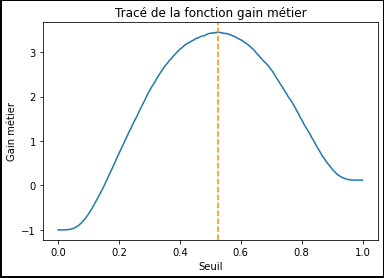

In [ ]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))


,Predicted 0,Predicted 1
Actual 0,170394,55751
Actual 1,6103,13757


**Calcul de l'optimum sur le validation set**

In [ ]:
y_split_valid_pred_proba = xgbc_imp.predict_proba(X3_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X3_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_test.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [ ]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)


Pour la valeur de seuil de 0.526 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.18.
Pour rappel : cet optimum est de 3.45 sur le train set.


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
precision = TP/(TP + FP)
recall = TP/(TP + FN)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,42223,14314
Actual 1,1652,3313


In [ ]:
print('precision = ',precision)
print('recall = ', recall)

precision =  0.18795030351165826
recall =  0.6672708962739174


**Adaboost** **classifier**


In [ ]:
X4 = X_[feature_importance_ada]

In [ ]:
# X4 = model.fit_transform(X4)

In [ ]:
X4 = pd.DataFrame(model.fit_transform(X4), columns=X4.columns, index=X4.index)

In [ ]:
# data splitting
X4_train, X4_test, y_train, y_test = train_test_split(X4, y, train_size=0.8, stratify=y)

In [ ]:
ada_imp = ada.fit(X4_train, y_train)

In [ ]:
evaluate_model(ada_imp,X4_train,X4_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.7620
Validation roc auc score= 0.7555

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[225996    149]
 [ 19655    205]]
Validation confusion matrix:
 [[56502    35]
 [ 4918    47]]


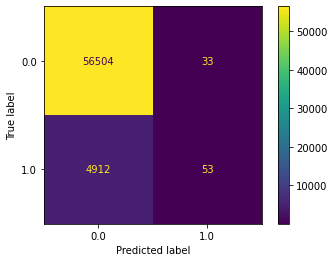

In [ ]:
plot_confusion_matrix(ada_imp, X4_test, y_test)

In [ ]:
ypred_ada_imp = ada_imp.predict(X4_test)

In [ ]:
model_score(y_test,ypred_ada_imp)

Précision: 0.7498
Sensitivité: 0.5048


In [ ]:
model_score(y_test,ypred_ada_imp)

Précision: 0.6211
Sensitivité: 0.0119



 **Détermination du seuil pour l'optimum sur le train set** 

In [ ]:
y_split_train_pred_proba = ada_imp.predict_proba(X4_train)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X4_train.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)


In [ ]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 0.485
Valeur maximum de la fonction gain métier : 3.07


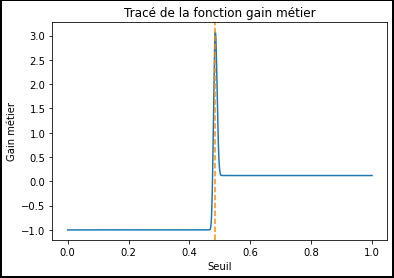

In [ ]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,162874,63271
Actual 1,6277,13583


**Calcul de l'optimum sur le validation set**

In [ ]:
y_split_valid_pred_proba = ada_imp.predict_proba(X4_test)

validation_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X4_test.index,
    'pred_proba':
    y_split_valid_pred_proba[:, 1],
    'TARGET_True':
    y_train.astype(int)
})


In [ ]:
def gain_modelise(seuil, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (validation_set_pred_proba['pred_proba'] >
                       seuil).astype(int)
    TP = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 1)).sum()
    TN = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 0)).sum()
    FP = ((validation_set_pred_proba['TARGET_True'] == 0) &
          (ser_TARGET_pred == 1)).sum()
    FN = ((validation_set_pred_proba['TARGET_True'] == 1) &
          (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [ ]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)


Pour la valeur de seuil de 0.485 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de 3.16.
Pour rappel : cet optimum est de 3.07 sur le train set.


In [ ]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(seuil=max_seuil, verbose=True)
precision = TP/(TP + FP)
recall = TP/(TP + FN)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,39260,17277
Actual 1,1370,3595


In [ ]:
print('precision = ',precision)
print('recall = ', recall)

precision =  0.17224032196243771
recall =  0.7240684793554885


# **Target** **Classes** **Balancing**





As in our target major is 91% and minor is 9%, we can't use either oversampling only as the minor is very small or downsampling only as we will lose alot of our data, so we will apply both oversample on minor class firstly, then downsample the major one.

In [ ]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
# create oversampler, downsampler instants
oversampler = SMOTE(sampling_strategy=0.25)                     # minor/major = 1/4
undersampler = RandomUnderSampler(sampling_strategy=0.75)       # minor/major = 3/4

**LGBMClassifier**

In [ ]:
# create pipeline

steps_clf = [('oversampler', oversampler), ('model', clf_imp)]
clf_pipeline2 = Pipeline(steps=steps_clf)

# # train 
# clf_pipeline2 = clf_pipeline2.fit(X2_train, y_train)

# # evaluate
# evaluate_model_lgbm(clf_pipeline2)

In [ ]:
# train 
clf_pipeline2 = clf_pipeline2.fit(X2_train, y_train)

In [ ]:
evaluate_model(clf_pipeline2,X2_train,X2_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.9602
Validation roc auc score= 0.4889

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[222130   4015]
 [  9291  10569]]
Validation confusion matrix:
 [[55017  1520]
 [ 4827   138]]


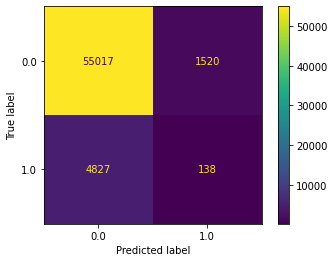

In [ ]:
plot_confusion_matrix(clf_pipeline2, X2_test, y_test)

In [ ]:
y_pred_clf_pipeline2 = clf_pipeline2.predict(X2_test)

In [ ]:
model_score(y_test,y_pred_clf_pipeline2 )

Précision: 0.5114
Sensitivité: 0.5001


# **LGBMClassifier** **with** **F1_score** 

In [ ]:
from sklearn.metrics import fbeta_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [ ]:
def cross_validation_F1(x, y, model):
    result= cross_val_score(model, x, y, cv=kfold, scoring="f1", n_jobs=-1)
    print("Score: %f" % result.mean())

In [ ]:
steps_for_balancing = [('oversampler', oversampler), ('undersampler', undersampler)]
balancing = Pipeline(steps=steps_for_balancing)

In [ ]:
 X2_train_resampled, y_train_resampled = balancing.fit_resample(X2_train, y_train)

In [ ]:
clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

scores_clf = cross_validation_F1(X2_train_resampled, y_train_resampled, clf)
print(scores_clf)

Score: 0.775416
None


In [ ]:
clf_f1 = clf.fit(X2_train_resampled, y_train_resampled)

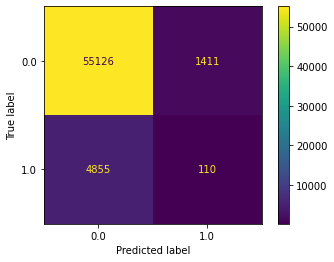

In [ ]:
plot_confusion_matrix(clf, X2_test, y_test)

In [ ]:
y_pred_clf_f1 = clf.predict(X2_test)

In [ ]:
model_score(y_test,y_pred_clf_f1 )

Précision: 0.5023
Sensitivité: 0.5008


**XGBClassifier**

In [ ]:
# create pipeline

steps = [('oversampler', oversampler), ('undersampler', undersampler), ('model', xgbc_imp)]
xgbc_pipeline2 = Pipeline(steps=steps)

# # train 
# xgbc_pipeline2.fit(X3_train, y_train)

# # evaluate
# evaluate_model(xgbc_pipeline2)

In [ ]:
# train 
xgbc_pipeline2.fit(X3_train, y_train)

Pipeline(steps=[('oversampler', SMOTE(sampling_strategy=0.25)),
                ('undersampler', RandomUnderSampler(sampling_strategy=0.75)),
                ('model',
                 XGBClassifier(learning_rate=0.2, n_jobs=-1, random_state=100,
                               scale_pos_weight=11.39507299270073))])

In [ ]:
evaluate_model(xgbc_pipeline2,X3_train,X3_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.5481
Validation roc auc score= 0.4951

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[ 19858      2]
 [224971   1174]]
Validation confusion matrix:
 [[ 4941    24]
 [56236   301]]


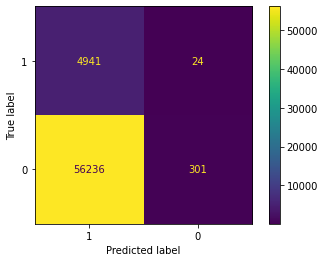

In [ ]:
plot_confusion_matrix(xgbc_pipeline2, X3_test, y_test, labels=[1,0])

In [ ]:
y_pred_xgbc_pipeline2 = xgbc_pipeline2.predict(X3_test)

In [ ]:
model_score(y_test,y_pred_xgbc_pipeline2)

Précision: 0.5035
Sensitivité: 0.5002


# **XGBclassifier** **with** **f1_score** 

In [ ]:
steps_for_balancing = [('oversampler', oversampler), ('undersampler', undersampler)]
balancing = Pipeline(steps=steps_for_balancing)

In [ ]:
def RndSrch_Tune_balance(model, X, y, params):
    
    clf = RandomizedSearchCV(model, params, scoring ="f1", cv = kfold, n_jobs=-1, random_state=100)
    clf.fit(X, y)
    print("best score is :" , clf.best_score_)
    print("best estimator is :" , clf.best_estimator_)
    print("best Params is :" , clf.best_params_)
    return (clf.best_score_)

In [ ]:
 X3_train_resampled, y_train_resampled = balancing.fit_resample(X3_train, y_train)

In [ ]:
param_xgbc = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
             'subsample':[1,0.5,0.2,0.1],
             'max_depth' : range(2,11,1),
             'n_estimators':range(50,300,50)}

RndSrch_Tune_balance(XGBClassifier(random_state = 100, n_jobs=-1, scale_pos_weight=estimate), 
             X3_train_resampled, y_train_resampled, param_xgbc)

best score is : 0.6129026413999384
best estimator is : XGBClassifier(max_depth=5, n_estimators=250, n_jobs=-1, random_state=100,
              scale_pos_weight=11.386988922457201, subsample=0.1)
best Params is : {'subsample': 0.1, 'n_estimators': 250, 'max_depth': 5, 'learning_rate': 0.1}


0.6129026413999384

In [ ]:
from xgboost import XGBClassifier
xgbc = XGBClassifier(learning_rate=0.1,
                     subsample= 0.1,
                     n_estimators= 250,
                     max_depth=5, 
                     n_jobs=-1, 
                     random_state=100,
                     scale_pos_weight=11.386988922457201)

                      
                     
                    
scores_xgbc = cross_validation_F1(X3_train_resampled, y_train_resampled, xgbc)
print(scores_xgbc)

Score: 0.613052
None


In [ ]:
xgbc_f1 = xgbc.fit(X3_train_resampled, y_train_resampled)

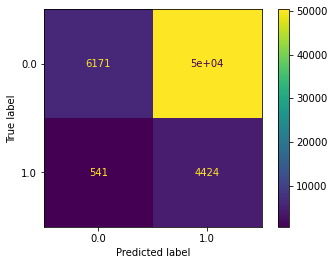

In [ ]:
plot_confusion_matrix(xgbc, X3_test, y_test)

In [ ]:
y_pred_xgbc_f1 = xgbc_f1.predict(X3_test)

In [ ]:
model_score(y_test,y_pred_xgbc_f1)

Précision: 0.5012
Sensitivité: 0.5015


**Adaboost** **classifier**

In [ ]:
# create pipeline

steps = [('oversampler', oversampler), ('undersampler', undersampler), ('model', ada_imp)]
ada_pipeline2 = Pipeline(steps=steps)

# # train 
# ada_pipeline2.fit(X4_train, y_train)

# # evaluate
# evaluate_model(ada_pipeline2)

In [ ]:
# train 
ada_pipeline2.fit(X4_train, y_train)

Pipeline(steps=[('oversampler', SMOTE(sampling_strategy=0.25)),
                ('undersampler', RandomUnderSampler(sampling_strategy=0.75)),
                ('model',
                 AdaBoostClassifier(learning_rate=0.2, n_estimators=200,
                                    random_state=100))])

In [ ]:
# evaluate
evaluate_model(ada_pipeline2,X4_train,X4_test)

Training & Validation ROC AUC Scores:
 ----------------------------------------
Training   roc auc score= 0.7347
Validation roc auc score= 0.7290

Training & Validation Confusion Metrices:
Training   confusion matrix:
 [[195686  30459]
 [ 11821   8039]]
Validation confusion matrix:
 [[48874  7663]
 [ 2990  1975]]


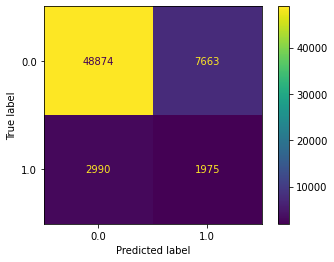

In [ ]:
plot_confusion_matrix(ada_pipeline2, X4_test, y_test)

In [ ]:
y_pred_ada_pipeline2 = ada_pipeline2.predict(X4_test)

In [ ]:
model_score(y_test,y_pred_ada_pipeline2)

Précision: 0.5772
Sensitivité: 0.6359


# **Adaboost** **with** **F1_score** 

In [ ]:
steps_for_balancing = [('oversampler', oversampler), ('undersampler', undersampler)]
balancing = Pipeline(steps=steps_for_balancing)

In [ ]:
def RndSrch_Tune_balance(model, X, y, params):
    
    clf = RandomizedSearchCV(model, params, scoring ="f1", cv = kfold, n_jobs=-1, random_state=100)
    clf.fit(X, y)
    print("best score is :" , clf.best_score_)
    print("best estimator is :" , clf.best_estimator_)
    print("best Params is :" , clf.best_params_)
    return (clf.best_score_)

In [ ]:
 X4_train_resampled, y_train_resampled = balancing.fit_resample(X4_train, y_train)

In [ ]:
# Value of hyperparameters for random search

param_ada = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
             'algorithm': ['SAMME', 'SAMME.R'],
             'n_estimators':range(50,300,50)}

RndSrch_Tune_balance(AdaBoostClassifier(random_state = 100) ,X4_train_resampled, y_train_resampled, param_ada)

best score is : 0.7467198989050067
best estimator is : AdaBoostClassifier(learning_rate=0.2, n_estimators=200, random_state=100)
best Params is : {'n_estimators': 200, 'learning_rate': 0.2, 'algorithm': 'SAMME.R'}


0.7467198989050067

In [ ]:
ada = AdaBoostClassifier(learning_rate=0.2, 
                         algorithm = 'SAMME.R',
                         n_estimators=200, 
                         random_state=100)
scores_ada = cross_validation_F1(X4_train_resampled, y_train_resampled, ada)
print(scores_ada)

Score: 0.743794
None


In [ ]:
ada_f1 = ada.fit(X4_train_resampled, y_train_resampled)


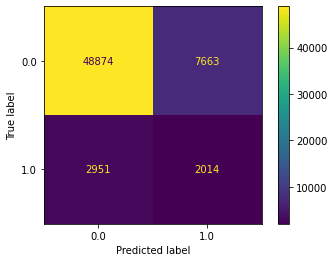

In [ ]:
plot_confusion_matrix(ada, X4_test, y_test)

In [ ]:
y_pred_ada_f1 = ada_f1.predict(X4_test)

In [ ]:
model_score(y_test,y_pred_ada_f1)

Précision: 0.5779
Sensitivité: 0.6364


In [ ]:
path = r'/content/ada_fbeta.pickle'
f = open(path, 'wb')
pickle.dump(ada_fbeta, f)
f.close()

# **FBETA_SCORE**

ADABOOST 

In [ ]:

from sklearn.metrics import fbeta_score, make_scorer


In [ ]:
f10_scorer = make_scorer(fbeta_score, beta=10)

In [ ]:
def cross_validation_F10(x, y, model):
    result= cross_val_score(model, x, y, cv=kfold, scoring= f10_scorer, n_jobs=-1)
    print("Score: %f" % result.mean())

In [ ]:
ada = AdaBoostClassifier(learning_rate=0.2, 
                         algorithm = 'SAMME.R',
                         n_estimators=200, 
                         random_state=100)
scores_ada = cross_validation_F10(X4_train_resampled, y_train_resampled, ada)
print(scores_ada)

Score: 0.701509
None


In [ ]:
ada_fbeta = ada.fit(X4_train_resampled, y_train_resampled)

In [ ]:
y_pred_ada_fbeta = ada_fbeta.predict(X4_test)

In [ ]:
model_score(y_test,y_pred_ada_fbeta)

Précision: 0.5779
Sensitivité: 0.6364


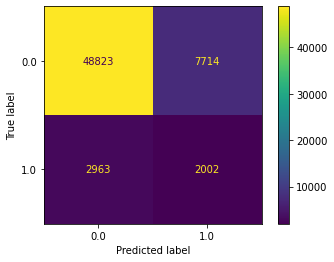

In [ ]:
plot_confusion_matrix(ada, X4_test, y_test)

# **Model** **Explainability** **with** **lime**




In [ ]:
pip install lime

In [ ]:

from __future__ import print_function

In [ ]:
predict_fn_lgbm = lambda x: clf.predict_proba(x).astype(float)

In [ ]:
import lime
import lime.lime_tabular      
explainer = lime.lime_tabular.LimeTabularExplainer(X_.values, mode='classification',training_labels=df['TARGET'], 
                                                   feature_names=X_.columns)


In [ ]:
# np.random.seed(1)
# i = int(np.random.randint(0,307507,size=1))

explanation = explainer.explain_instance(X_.values[0], predict_fn_lgbm)
# explanation.show_in_notebook()

In [ ]:
explanation.show_in_notebook(show_all=False)